# 前置条件

参考 README 在您的 AWS 账号部署 image rag 解决方案
## 导入 package

In [47]:
import json
import requests
import json
import base64
from PIL import Image
from io import BytesIO
from opensearchpy import OpenSearch, RequestsHttpConnection, AWSV4SignerAuth
from requests_aws4auth import AWS4Auth
from requests.auth import HTTPBasicAuth
from botocore.exceptions import ClientError
from os import listdir, walk

## 参数

In [19]:
local_image_path = '' # 本地存放图片的目录
os_endpoint = "" # opensearch endpoint
api_url = "" # 部署模版得到的 api gateway url
bucket_name = '' # 部署模版中创建的 S3 桶名
s3_client = boto3.client('s3')

## 函数定义

In [20]:
# image to base64
def image_to_base64(image_path):
    with Image.open(image_path) as img:
        # 创建一个字节流对象
        buffered = BytesIO()
        # 将图片保存到字节流中，并指定格式 (例如 'JPEG', 'PNG')
        img.save(buffered, format=img.format)
        # 获取字节数据并进行 Base64 编码
        img_base64 = base64.b64encode(buffered.getvalue()).decode('utf-8')
        return img_base64

In [22]:
# display image with limit
def display_with_limit(image_path, max_size=(300, 300)):
    # 打开图片
    with Image.open(image_path) as img:
        # 使用 thumbnail 方法保持图片比例，缩放到不超过指定大小
        img.thumbnail(max_size)
        # 显示图片
        display(img)

In [ ]:
# opensearch search query
def opensearch_search_query(query_image_path, query_text):
    # construct payload
    payload = {}
    payload["query_image"] = image_to_base64(query_image_path)
    payload["query_text"] = query_text
    # send request
    response = requests.post(api_url + "images/search", 
        json=payload,
        headers={"Content-Type": "application/json"},
    )
    print(response.json())
    return response.json()

In [ ]:
# display search_result
def display_search_result(response):
    for result in response['data']['results']:
        s3_key = result['image_path']
        file_path = 'tmp/' + s3_key.split('/')[-1]
        s3_client.download_file(bucket_name, s3_key, file_path)
        display_with_limit(file_path)

# 1. 得到所有图片路径

In [2]:
files_list = []

for (root, dirs, files) in walk(local_image_path):
    if ".DS_Store" in files:
        files.remove(".DS_Store")
    files_list.extend([ root + "/" + x for x in files ])
    
print(files_list)

['/Users/fangyili/Downloads/搜图10.19/图案局部相同/期望搜索图二.jpg', '/Users/fangyili/Downloads/搜图10.19/图案局部相同/1、搜索原图.jpg', '/Users/fangyili/Downloads/搜图10.19/图案局部相同/期望搜索图一.jpg', '/Users/fangyili/Downloads/搜图10.19/图案局部相同/期望搜索图二-resized.jpeg', '/Users/fangyili/Downloads/搜图10.19/图案局部相同/期望搜索图三.jpg', '/Users/fangyili/Downloads/搜图10.19/图案局部相同/期望搜索图四.jpg', '/Users/fangyili/Downloads/搜图10.19/图案局部相同/期望搜索图五.jpg', '/Users/fangyili/Downloads/搜图10.19/同款但是不同拍照方式或者角度/期望搜索图二.jpg', '/Users/fangyili/Downloads/搜图10.19/同款但是不同拍照方式或者角度/期望搜索图一.jpg', '/Users/fangyili/Downloads/搜图10.19/同款但是不同拍照方式或者角度/期望搜索图三.jpg', '/Users/fangyili/Downloads/搜图10.19/同款但是不同拍照方式或者角度/搜索原图.jpg', '/Users/fangyili/Downloads/搜图10.19/同款但是不同拍照方式或者角度/2/2、搜图原图.jpg', '/Users/fangyili/Downloads/搜图10.19/同款但是不同拍照方式或者角度/2/期望搜到的图片 (4).jpg', '/Users/fangyili/Downloads/搜图10.19/同款但是不同拍照方式或者角度/2/期望搜到的图片 (5).jpg', '/Users/fangyili/Downloads/搜图10.19/同款但是不同拍照方式或者角度/2/期望搜到的图片 (2).jpg', '/Users/fangyili/Downloads/搜图10.19/同款但是不同拍照方式或者角度/2/期望搜到的图片 (3).jpg', '/Users/fa

# 2. 上传图片

In [9]:
count = 0

for file in files_list:
    count += 1
    # construct payload
    payload = {}
    payload["image"] = image_to_base64(file)
    
    response = requests.post(api_url + "images", 
        json=payload,
        headers={"Content-Type": "application/json"},
    )
    print(response.json())
    
print(count)

<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
<Response [200]>
47


# 3. 测试

## 3.1 元素图相同，款式不同
搜索文字：Same pattern different product \
搜索原图：\
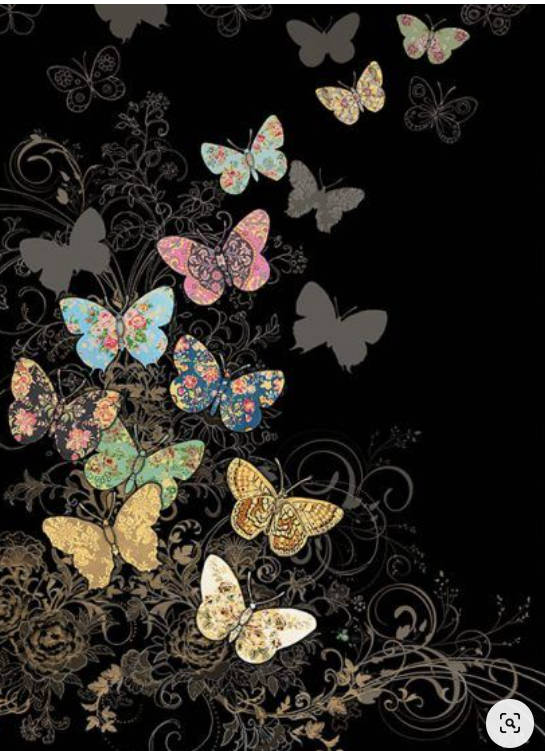 \
期望结果 \
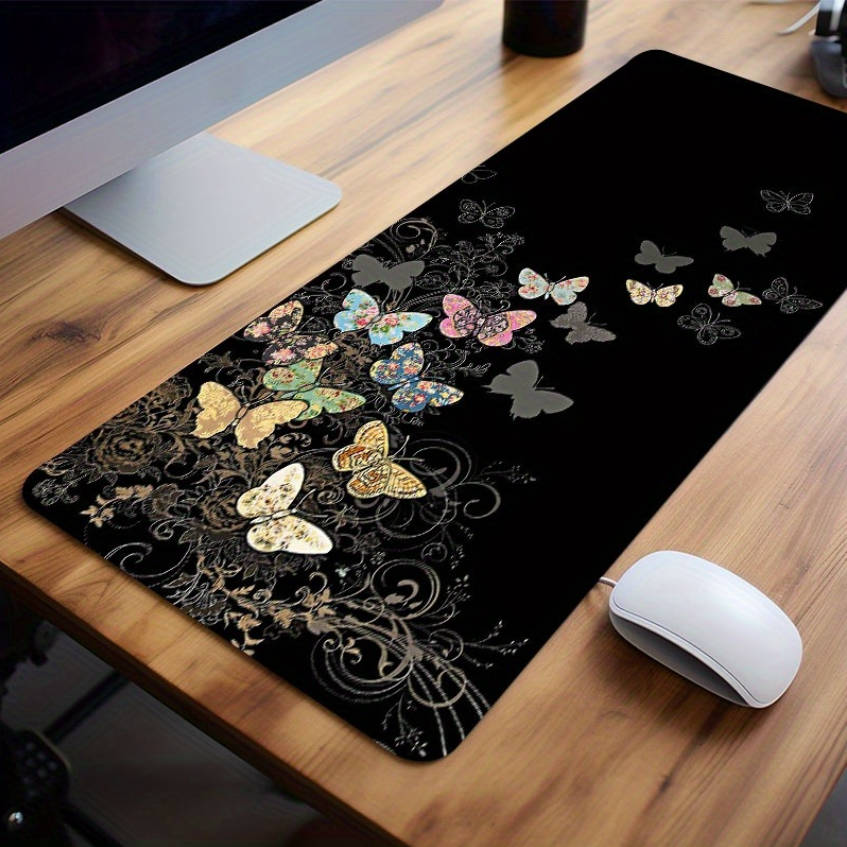 \
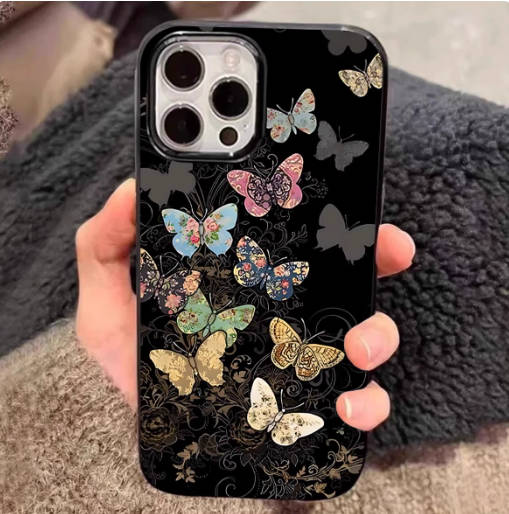 \
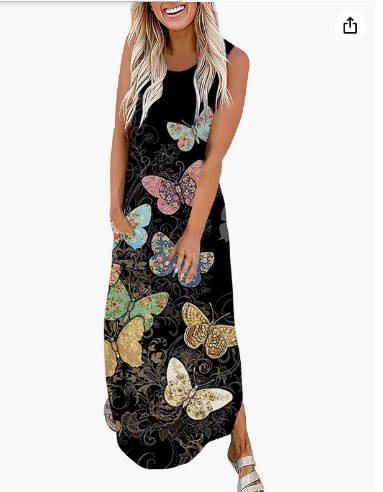 \
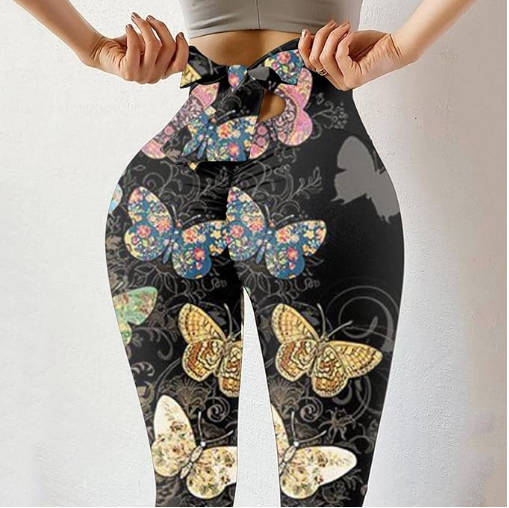 \
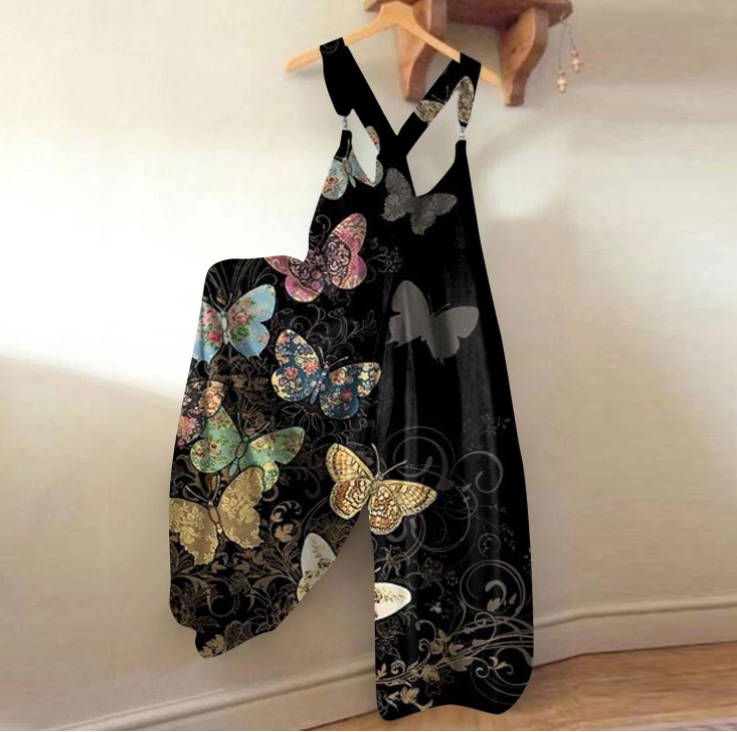 \

In [14]:
response = opensearch_search_query('/Users/fangyili/Downloads/搜图10.19/元素图相同，款式不同/1、搜索原图.jpg', "Same pattern different product")

{'code': 200, 'message': 'Search completed successfully', 'data': {'results': [{'id': '1%3A0%3AATnNAJMBuhEDGyEx57Qp', 'score': 1.3509418, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Butterflies\n- Floral patterns\n- Black background\n- Decorative swirls\n- Colors (pink, gold, blue, gray, white)\n\n## Summary\nThe image depicts a decorative arrangement of colorful butterflies and swirling floral patterns against a black background, creating an ornate and stylized design with a vibrant and whimsical feel.\n\n</result>', 'image_path': 'images/2760ae1e-446a-4658-890e-7ef7537ca9f7'}, {'id': '1%3A0%3ApnqZAJMBoapzJB17p3Jv', 'score': 1.3457258, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Butterflies\n- Floral patterns\n- Black background\n- Swirls\n- Colorful\n- Nature motifs\n\n## Summary\nThe image depicts a collection of colorful butterflies with intricate floral patterns on their wings, arranged against a black background with swirling floral vines and designs, cr

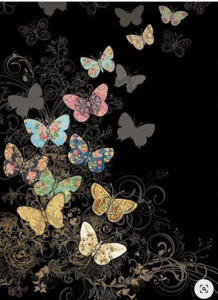

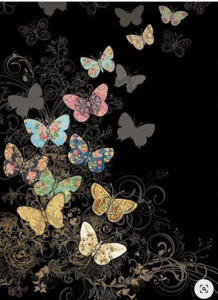

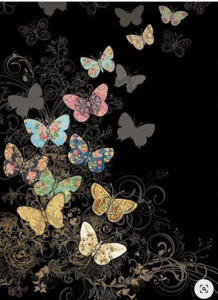

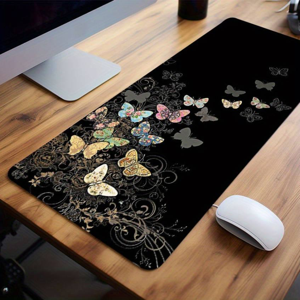

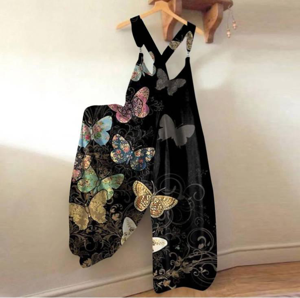

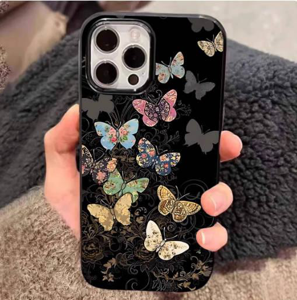

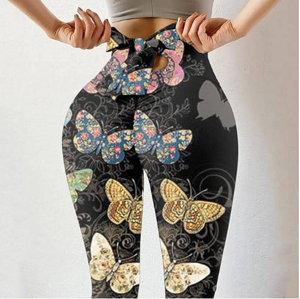

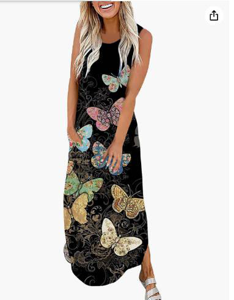

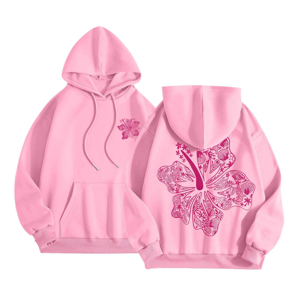

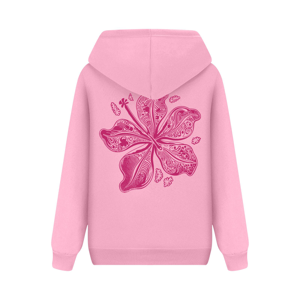

In [23]:
display_search_result(response)

## 3.2 同款但是不同拍照方式或角度

### Sample 1
搜索文字：Same product different camera angle \
搜索原图：\
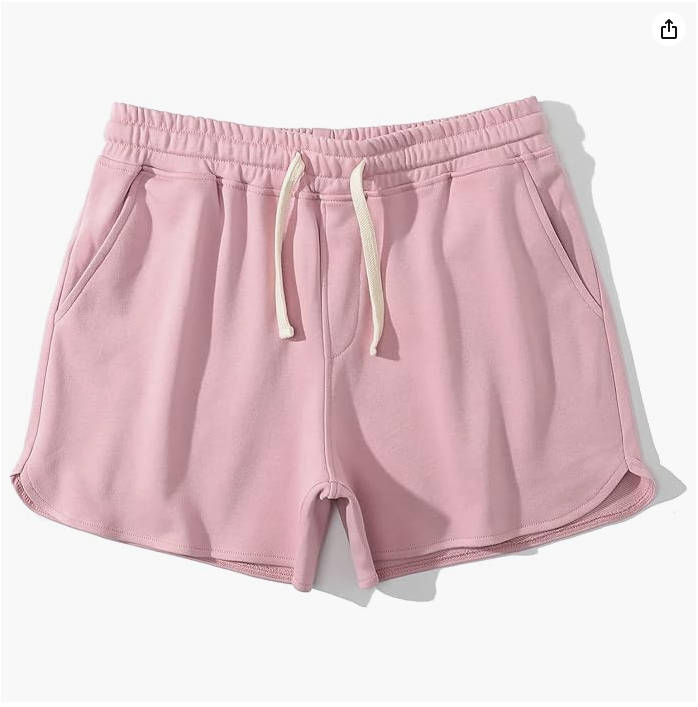 \
期望结果 \
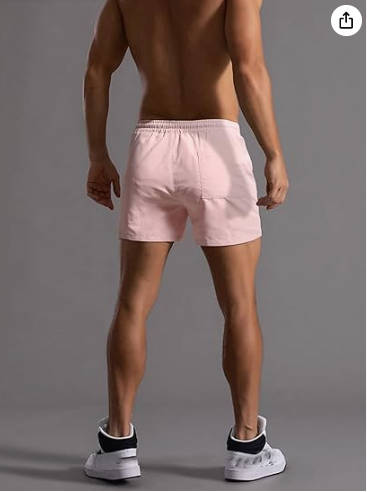 \
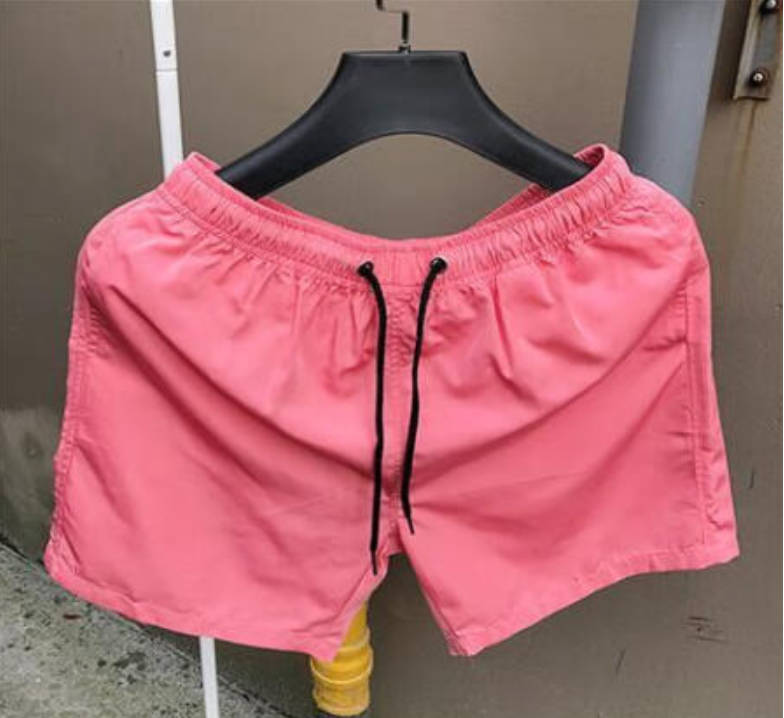 \
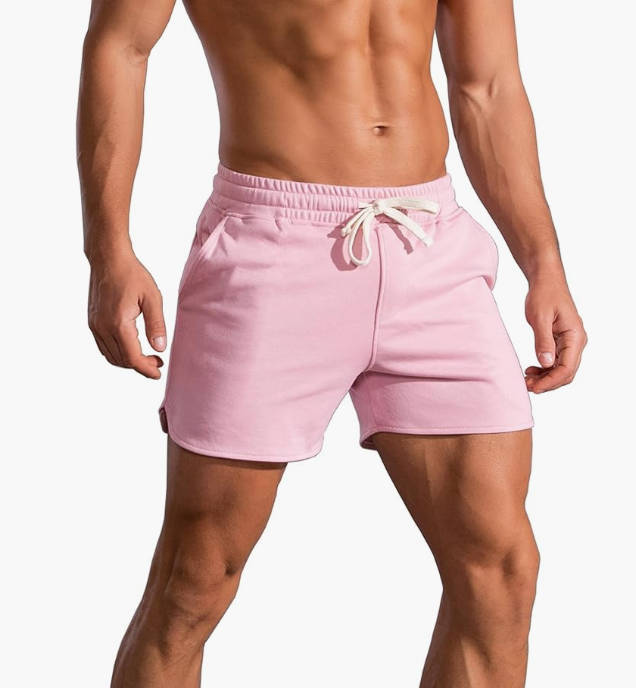 \

In [24]:
response = opensearch_search_query('/Users/fangyili/Downloads/搜图10.19/同款但是不同拍照方式或者角度/搜索原图.jpg', "Same product different camera angle")

{'code': 200, 'message': 'Search completed successfully', 'data': {'results': [{'id': '1%3A0%3Am3qXAJMBoapzJB17cHKP', 'score': 1.3439292, 'description': "<result>\n# Image Analysis\n\n## Tags\n- Women's shorts\n- Pink clothing\n- Casual athleisure wear\n- Drawstring waist\n- Athletic apparel\n\n## Summary\nThe image displays a pair of light pink athletic shorts for women, featuring a drawstring waist and a casual, relaxed fit, ideal for athleisure wear or lounging.\n\n</result>", 'image_path': 'images/6c1399ba-c967-4e85-8cbf-34159f1cd2cd'}, {'id': '1%3A0%3A7TmXAJMBuhEDGyExL7MW', 'score': 1.0425597, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Pink shorts\n- Drawstrings\n- Clothing display\n- Mannequin\n\n## Summary\nThe image shows a pair of pink shorts with black drawstrings hanging on a black mannequin, which appears to be in a retail or clothing display setting.\n\n</result>', 'image_path': 'images/9391197f-90f9-4c3e-b2c3-8d4fb1011eab'}, {'id': '1%3A0%3A7jmXAJMBuhEDGyExT

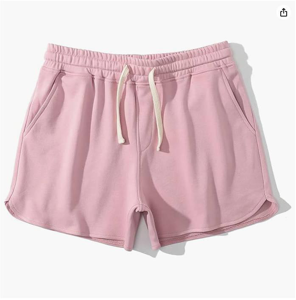

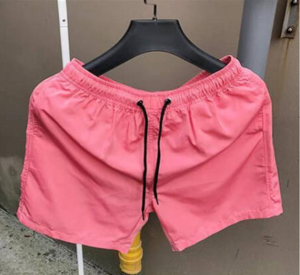

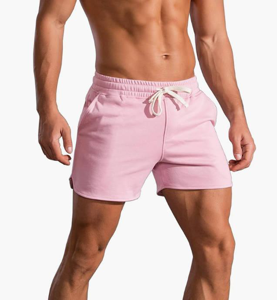

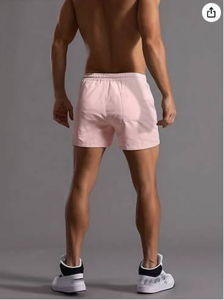

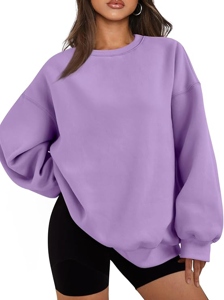

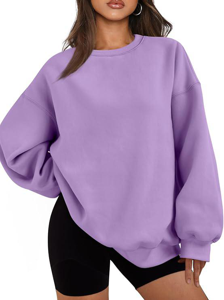

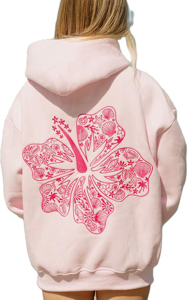

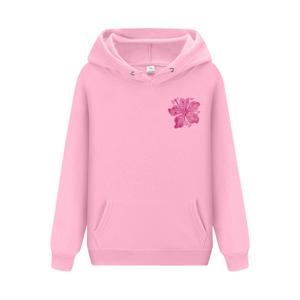

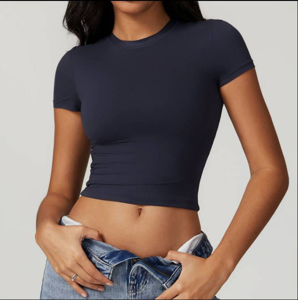

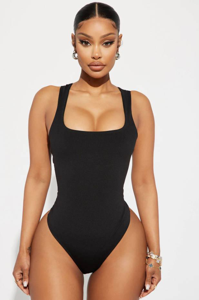

In [25]:
display_search_result(response)

### Sample 2
搜索文字：Same product different camera angle \
搜索原图：\
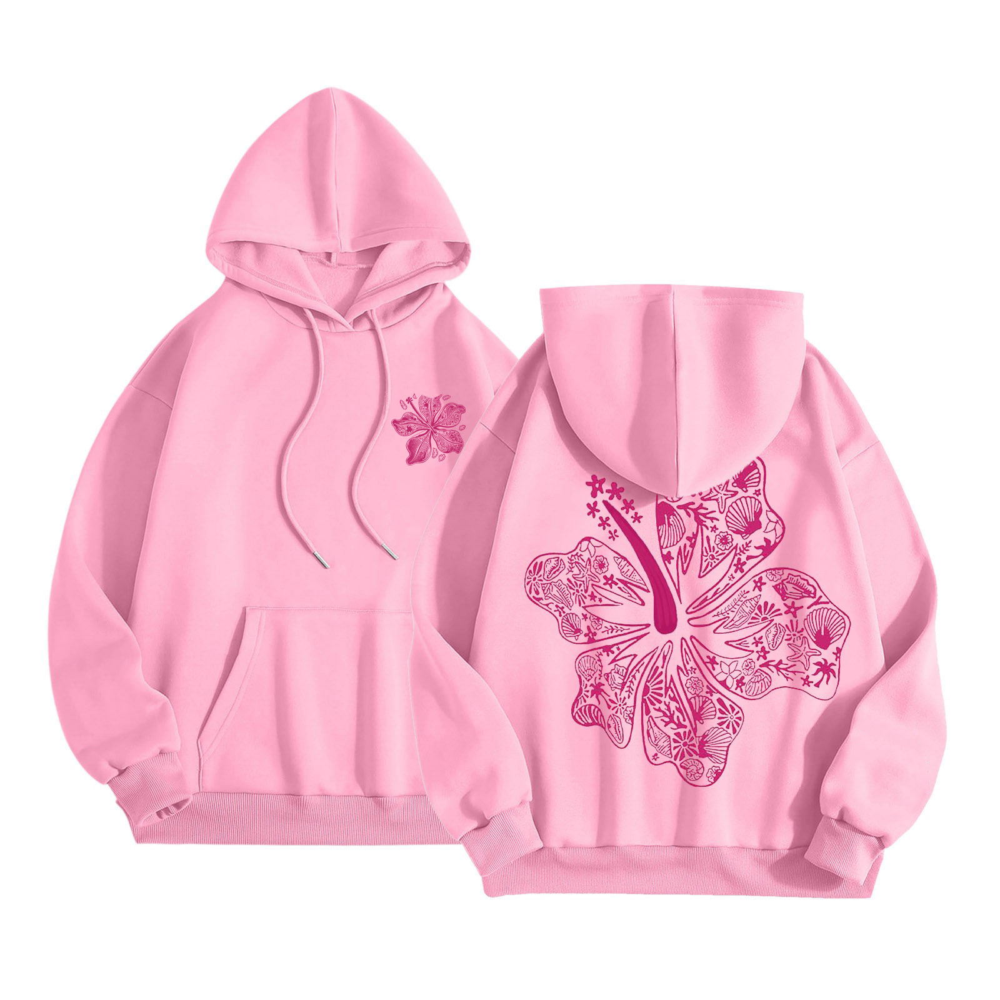 \
期望结果 \
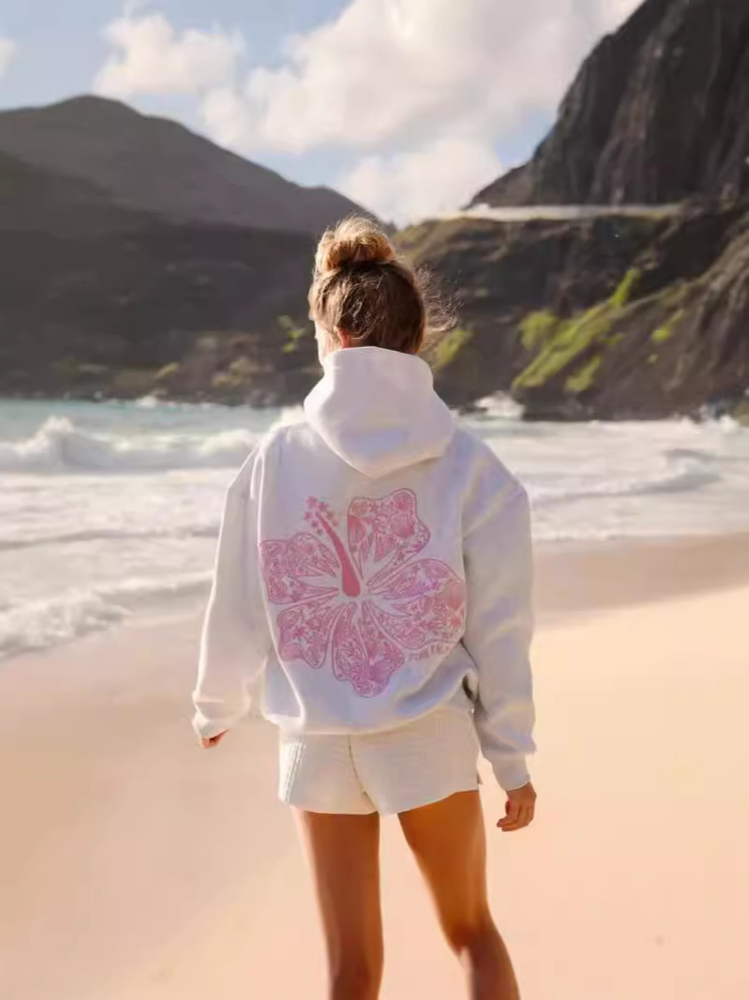 \
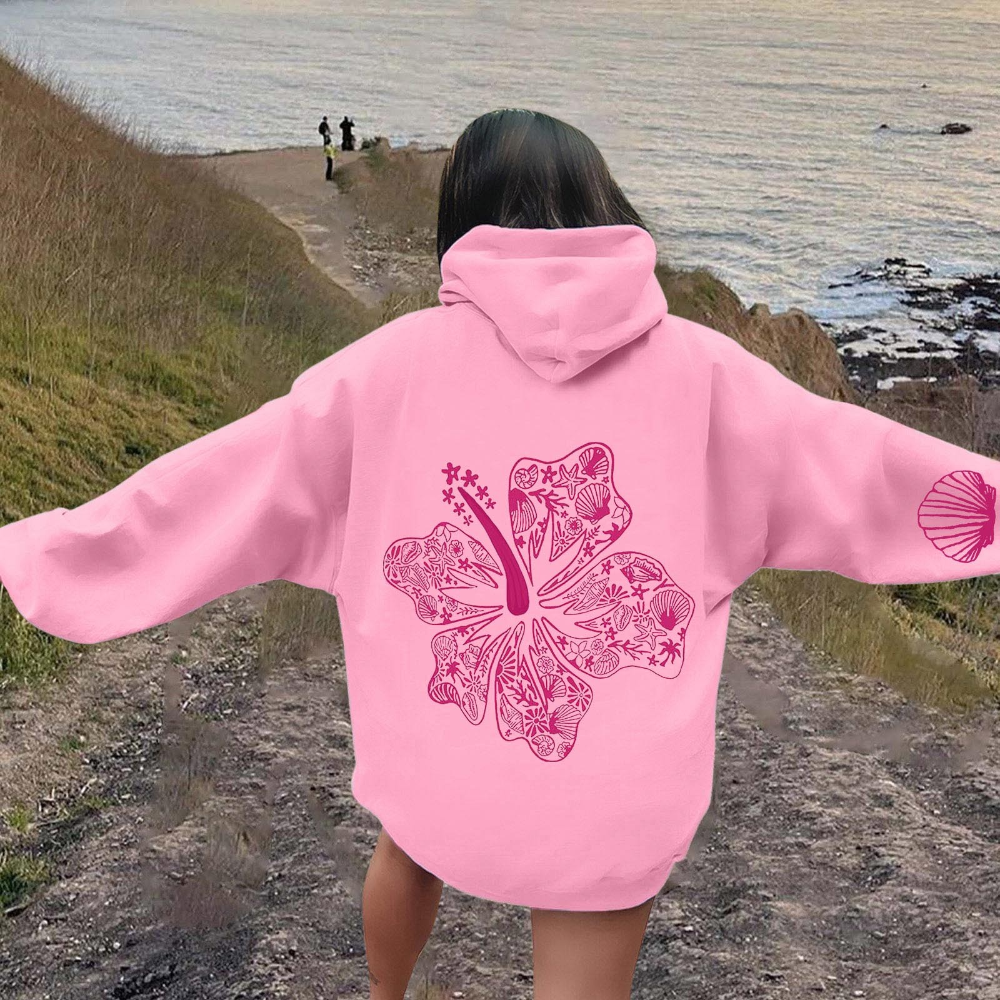 \
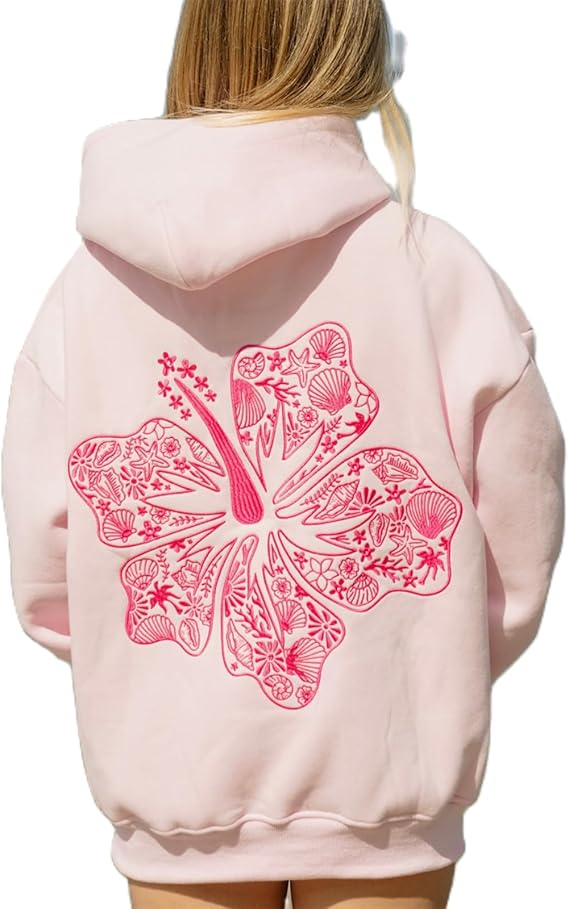 \
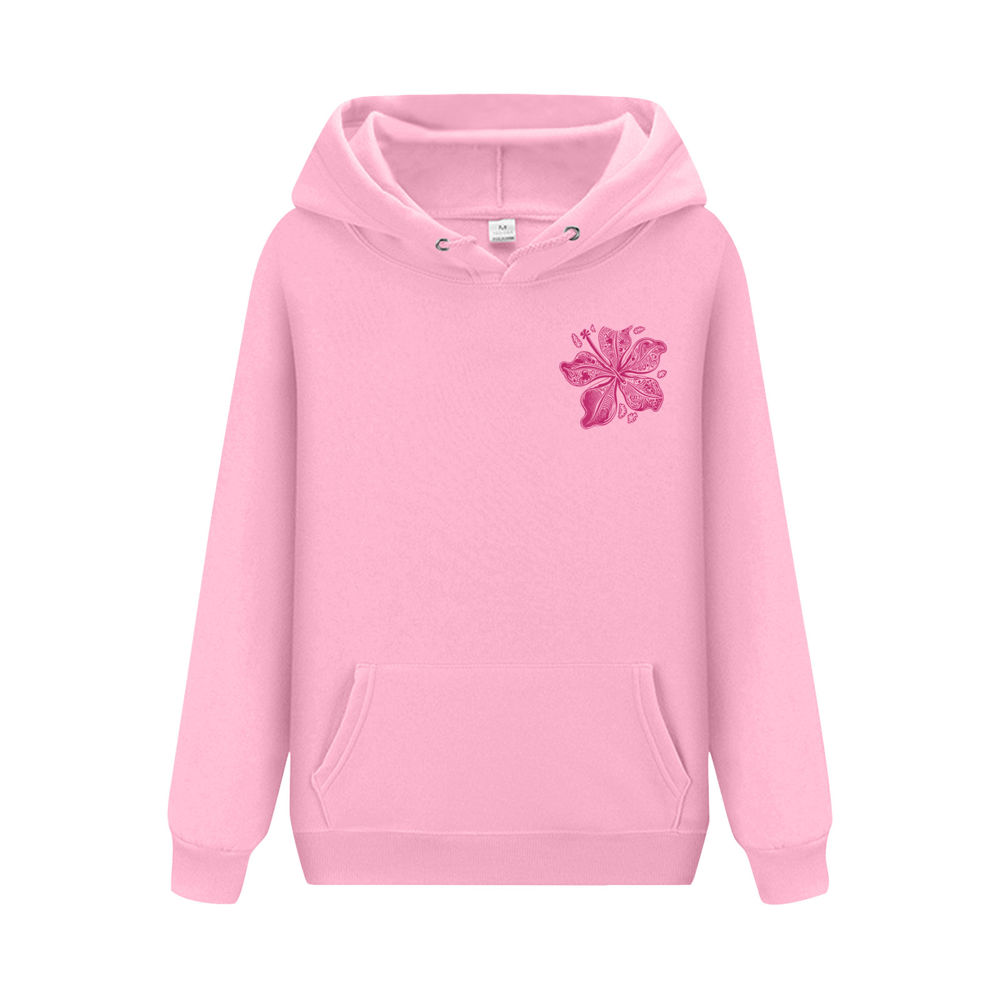 \
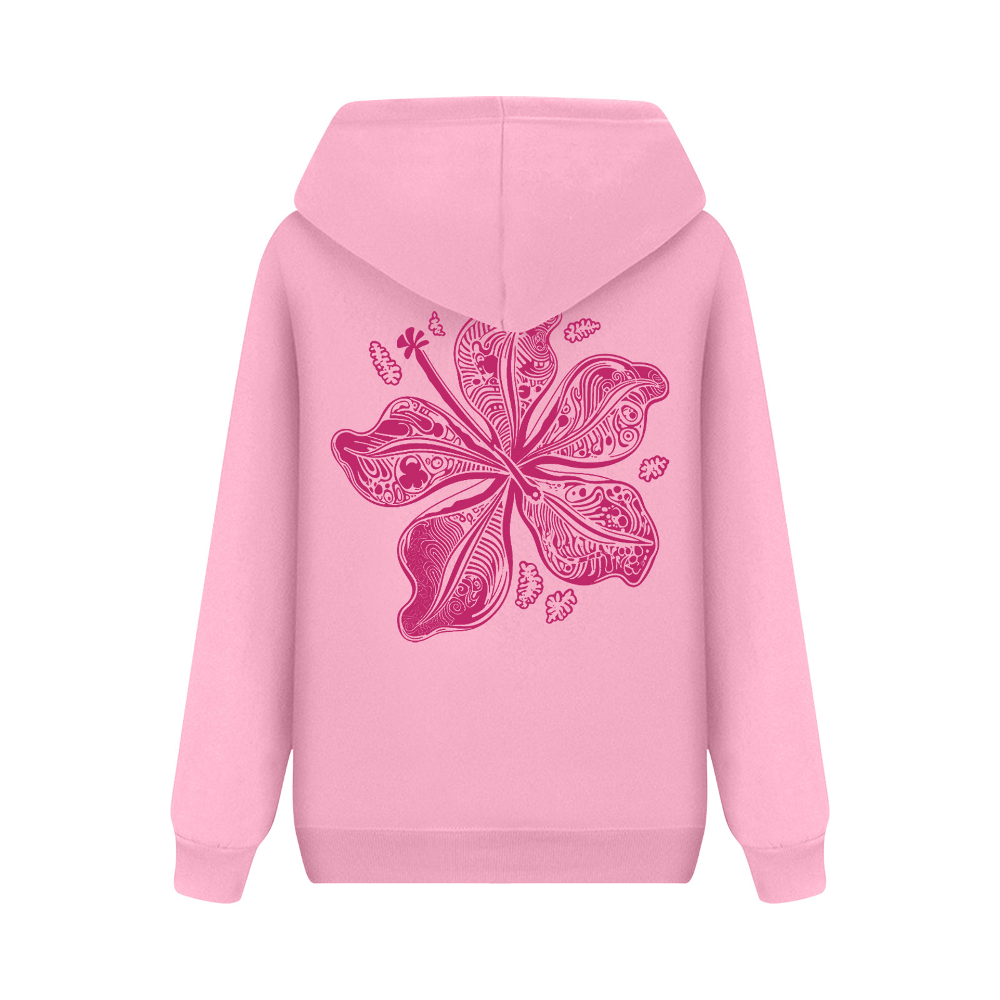

In [26]:
response = opensearch_search_query('/Users/fangyili/Downloads/搜图10.19/同款但是不同拍照方式或者角度/2/2、搜图原图.jpg', "Same product different camera angle")

{'code': 200, 'message': 'Search completed successfully', 'data': {'results': [{'id': '1%3A0%3A7zmXAJMBuhEDGyExkrP6', 'score': 1.3451385, 'description': "<result>\n# Image Analysis\n\n## Tags\n- Pink hoodies\n- Floral design\n- Butterfly motif\n- Women's fashion\n- Casual apparel\n\n## Summary\nThe image displays two pink hoodies, one with a floral design and the other with a stylized butterfly motif, which appear to be casual fashion items for women.\n\n</result>", 'image_path': 'images/dd989c49-5904-4693-afa8-f47b1ca975d0'}, {'id': '1%3A0%3A8DmXAJMBuhEDGyExxLPp', 'score': 1.0577402, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Hoodie\n- Pink\n- Floral design\n- Butterfly pattern\n- Doodle art\n\n## Summary\nThis image shows a pink hooded sweatshirt or hoodie with an intricate butterfly design printed on the back. The butterfly pattern appears to be in a doodle art style with swirling lines and shapes filling the wings in various shades of pink.\n\n</result>', 'image_path'

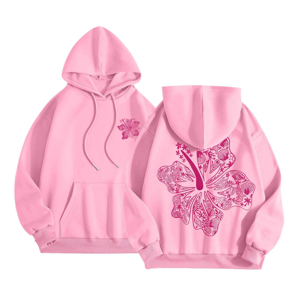

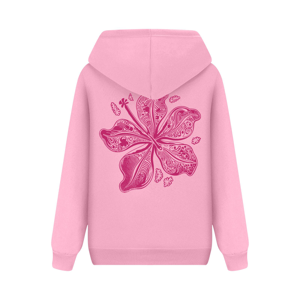

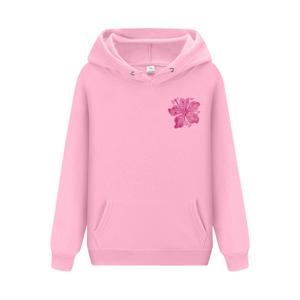

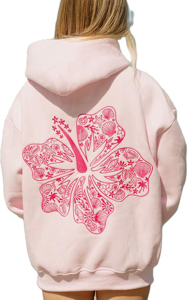

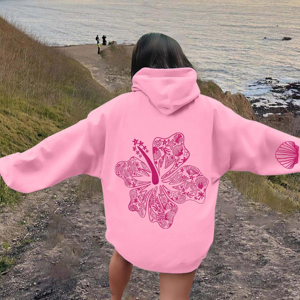

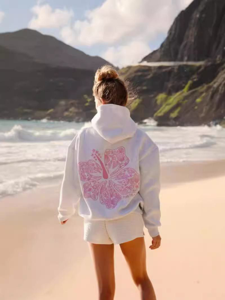

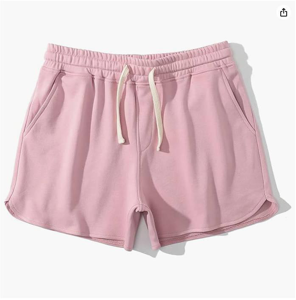

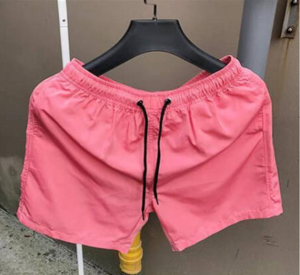

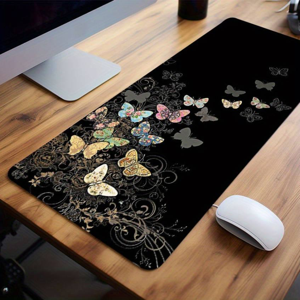

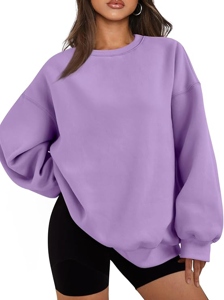

In [27]:
display_search_result(response)

## 3.2 图案局部相同
搜索文字：The pattern is partially the same \
搜索原图：\
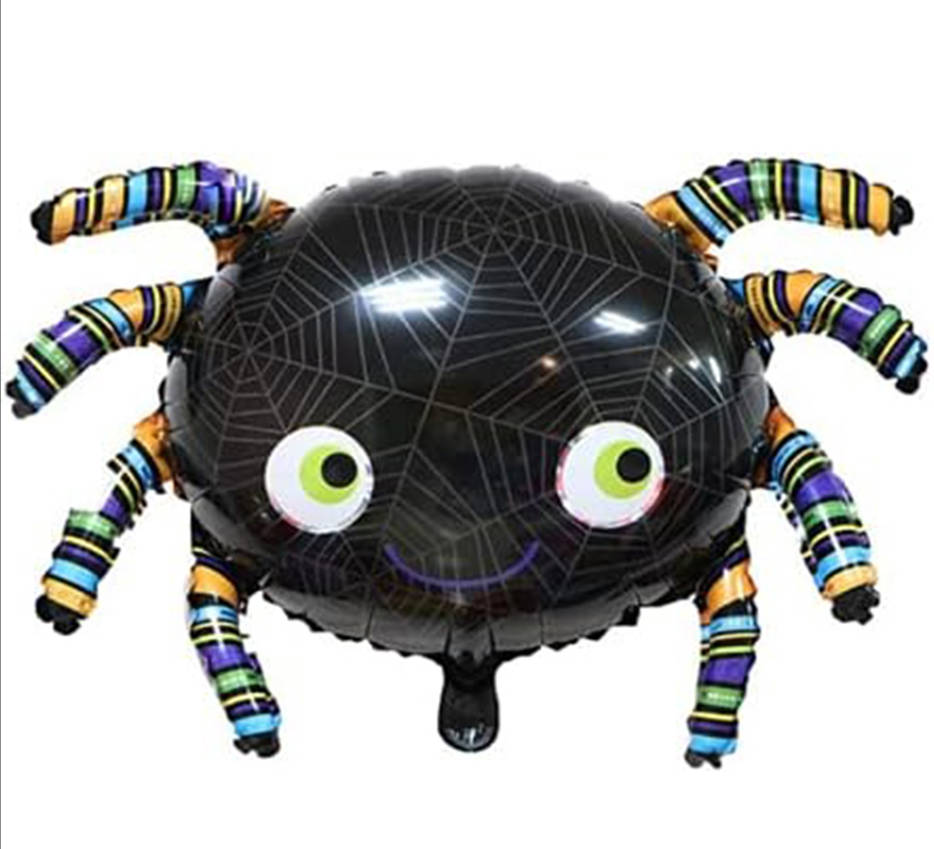 \
期望结果 \
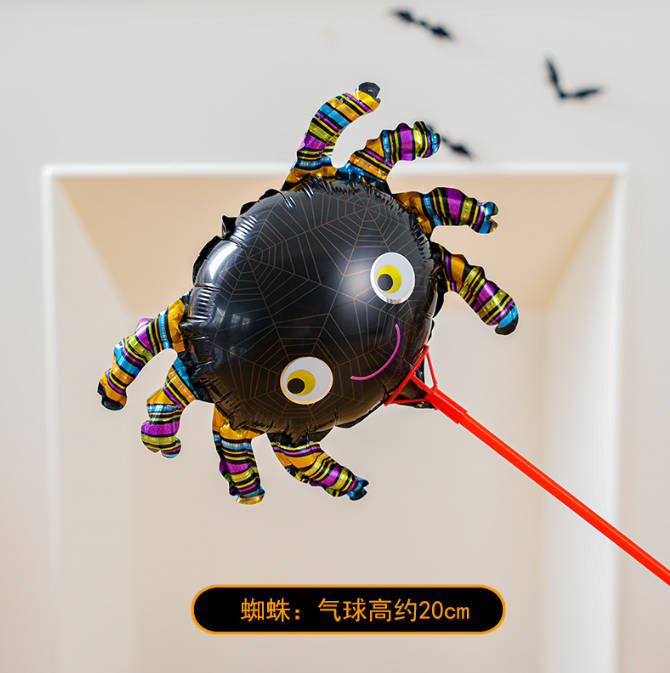 \
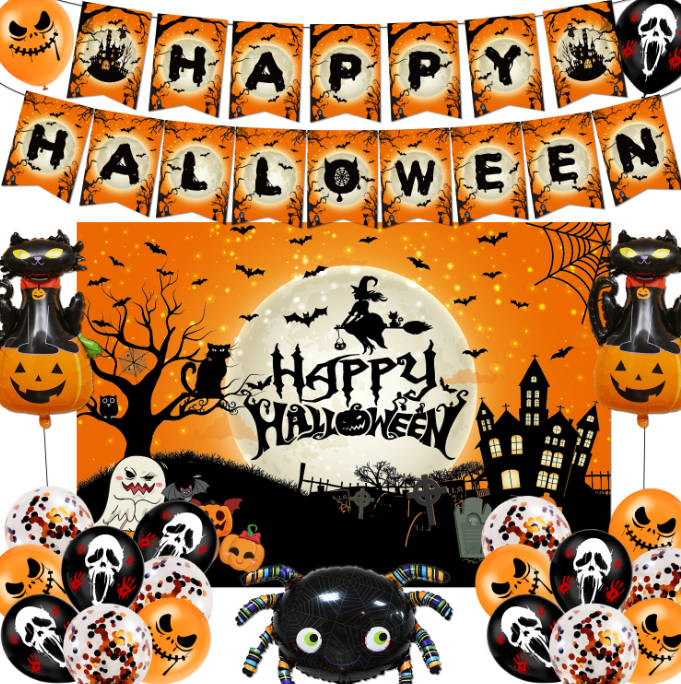 \
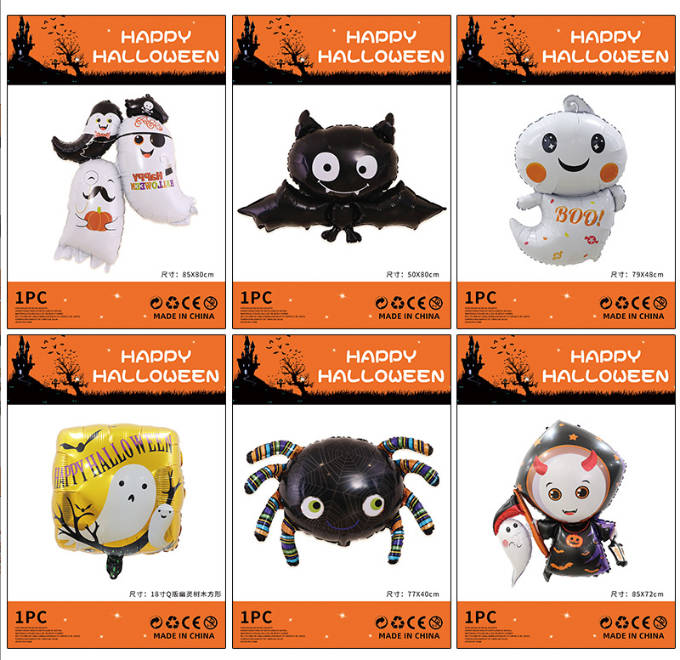 \
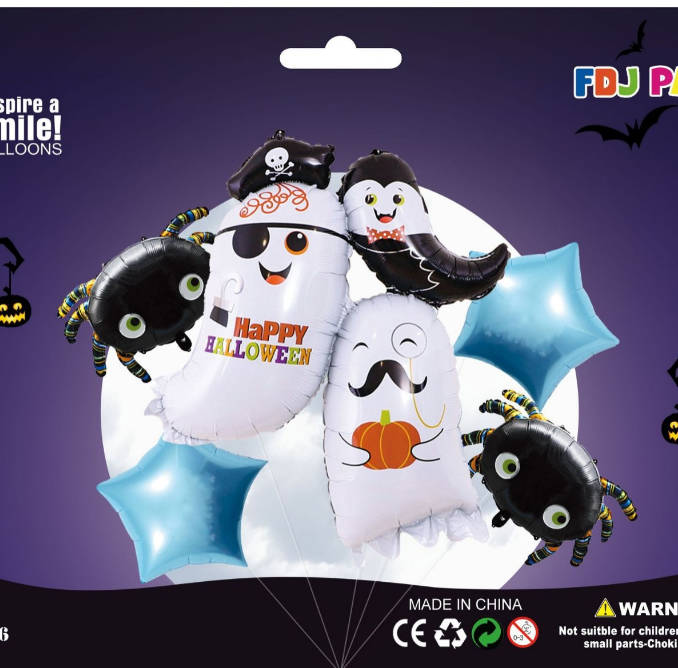 \
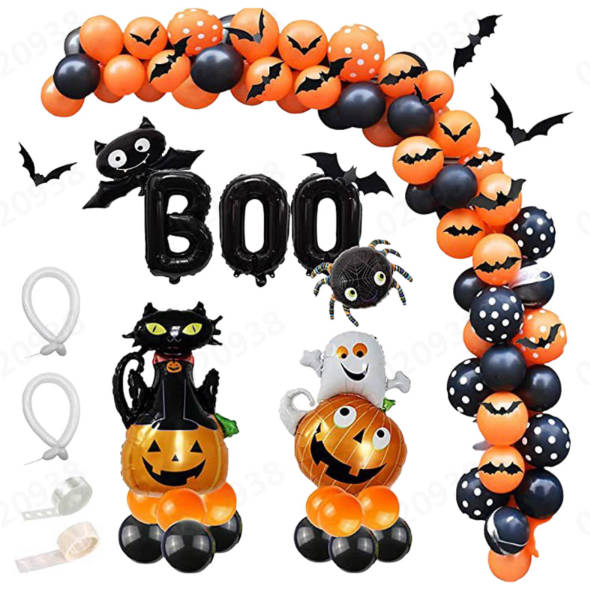

In [28]:
response = opensearch_search_query('/Users/fangyili/Downloads/搜图10.19/图案局部相同/1、搜索原图.jpg', "The pattern is partially the same")

{'code': 200, 'message': 'Search completed successfully', 'data': {'results': [{'id': '1%3A0%3A6jmWAJMBuhEDGyExlLM1', 'score': 1.3620608, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Spider balloon\n- Halloween decor\n- Black balloon\n- Multicolored legs\n- Arachnid theme\n- Cartoon-like eyes\n\n## Summary\nThe image shows a black balloon shaped like a creepy-looking spider, with colorful striped legs extending out and large green cartoon eyes. It appears to be a decorative Halloween item or spooky party decoration with an arachnid theme.\n\n</result>', 'image_path': 'images/df3c3689-b39d-4ed2-a669-741dbcbf55c2'}, {'id': '1%3A0%3Al3qWAJMBoapzJB17qnK-', 'score': 1.0437937, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Black balloon spider\n- Insect eyes\n- Striped legs\n- Held by red string\n- Foil balloons\n\n## Summary\nThe image depicts a black balloon spider with large eyes and stripy multicolored legs, suspended by a red string as if being held on a leash. Th

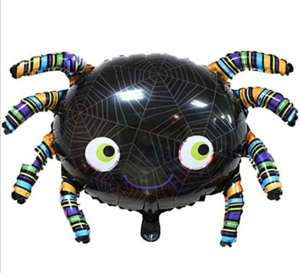

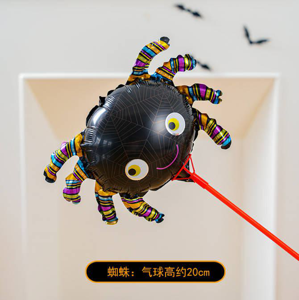

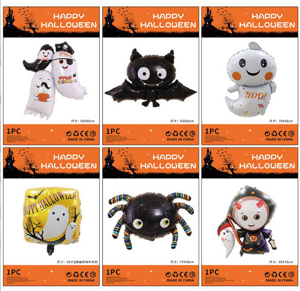

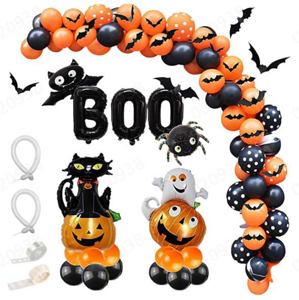

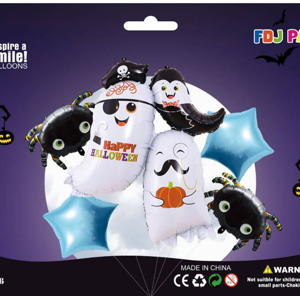

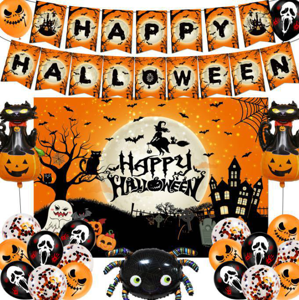

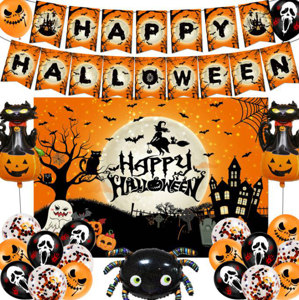

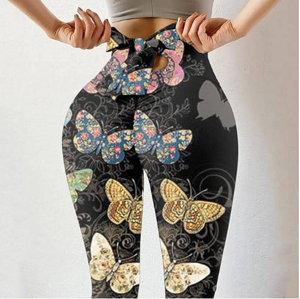

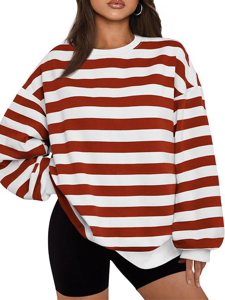

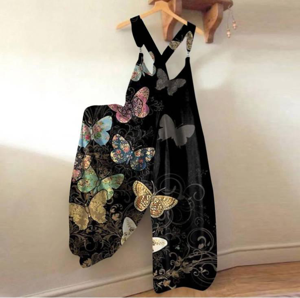

In [29]:
display_search_result(response)

## 3.4 模特款式近似
搜索文字：Similar style and model \
搜索原图：\
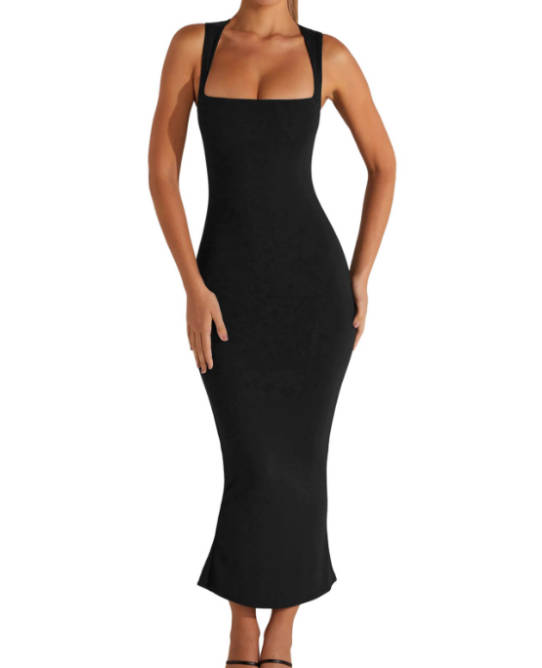 \
期望结果 \
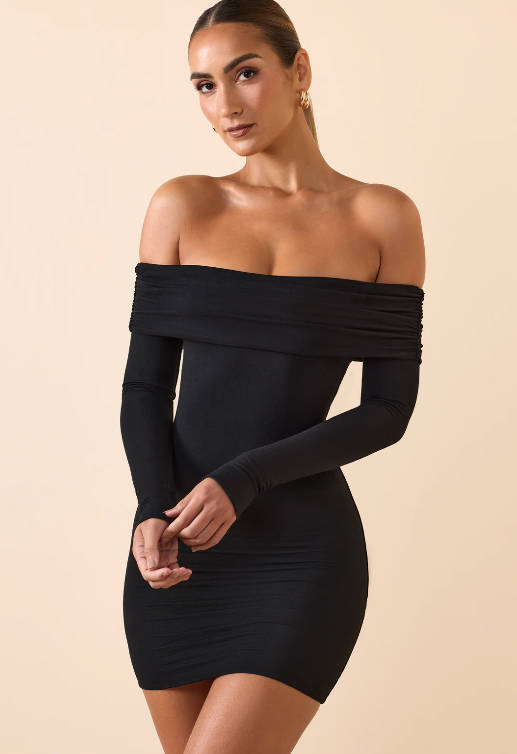 \
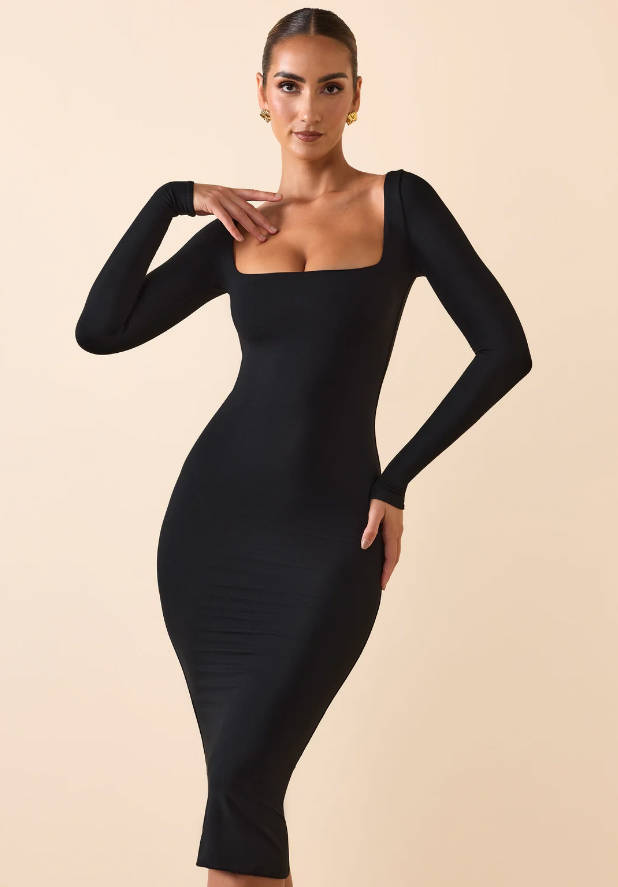 \
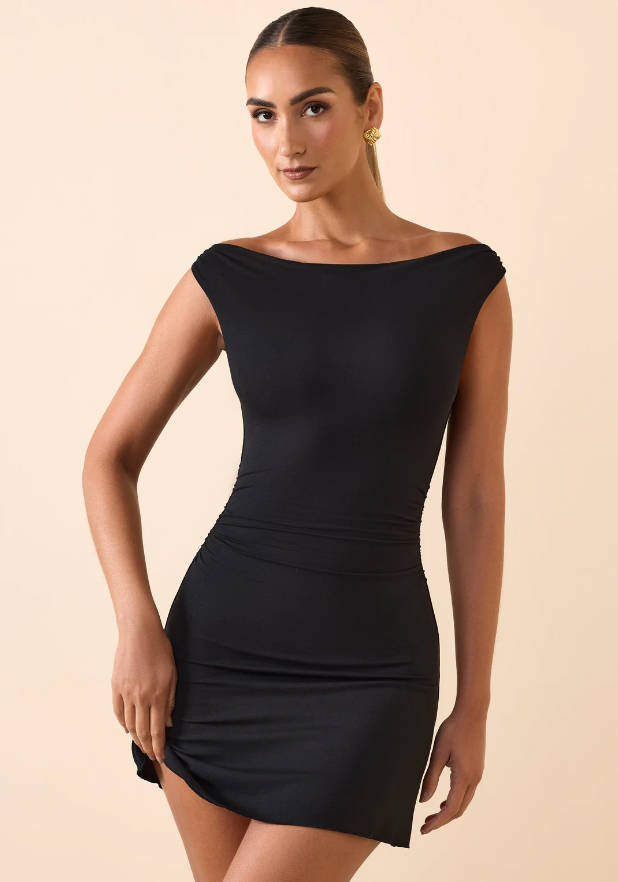 \
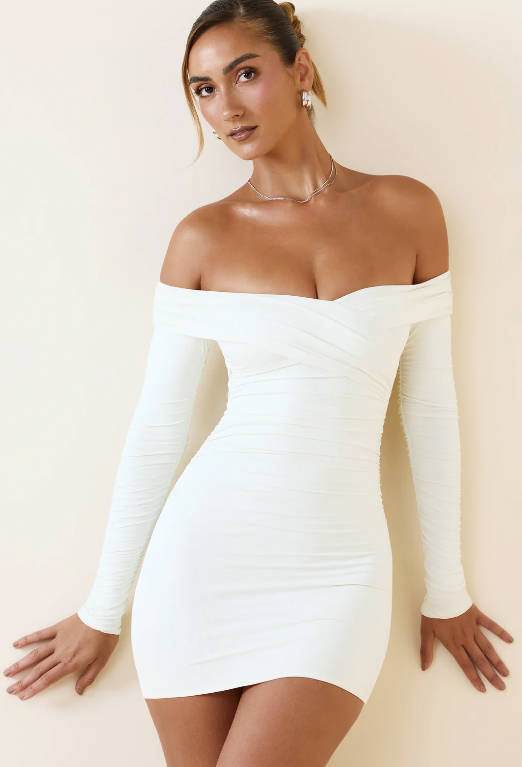

In [30]:
response = opensearch_search_query('/Users/fangyili/Downloads/搜图10.19/模特款式近似/1、搜索原图.jpg', "Similar style and model")

{'code': 200, 'message': 'Search completed successfully', 'data': {'results': [{'id': '1%3A0%3A_zmaAJMBuhEDGyExtLO-', 'score': 1.3582462, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Black dress\n- Sleeveless\n- Fitted\n- Knit fabric\n- Evening wear\n- Low neckline\n\n## Summary\nThe image shows a sleeveless, fitted black knit dress with a low neckline, suitable for evening or formal wear. The dress hugs the figure and falls below the knees.\n\n</result>', 'image_path': 'images/f1f59f03-d9ab-4546-8c9b-92328ce8e146'}, {'id': '1%3A0%3Aq3qaAJMBoapzJB17lnKc', 'score': 1.0348294, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Woman\n- Black dress\n- Long sleeves\n- Tight-fitting\n- Plunging neckline\n- Posing\n- Glamorous\n- Monochrome\n\n## Summary\nThe image depicts a glamorous woman wearing a tight-fitting black dress with long sleeves and a plunging neckline. She is posing confidently with one hand on her waist, exuding an elegant and stylish demeanor against a pla

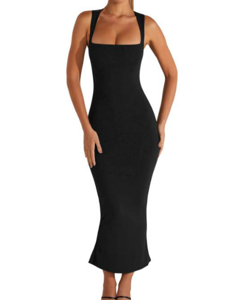

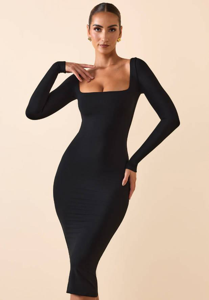

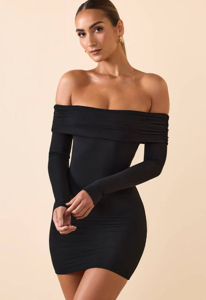

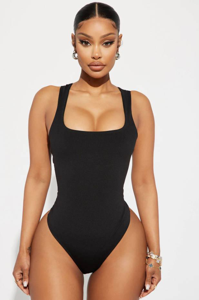

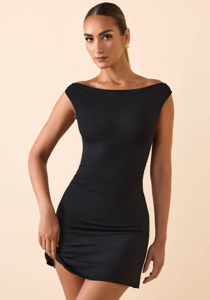

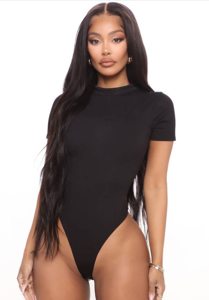

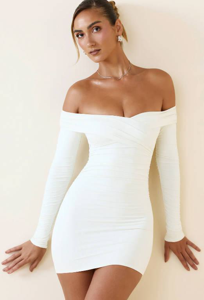

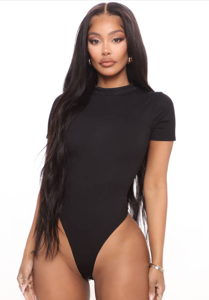

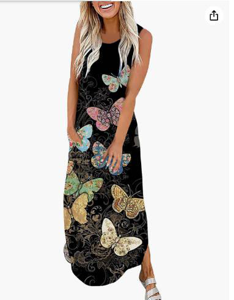

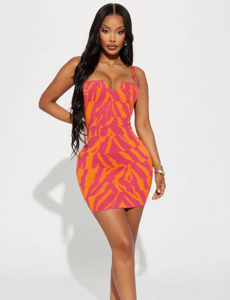

In [31]:
display_search_result(response)

## 3.5 模特相同，款式不同

### Sample 1
搜索文字：Same person different product \
搜索原图：\
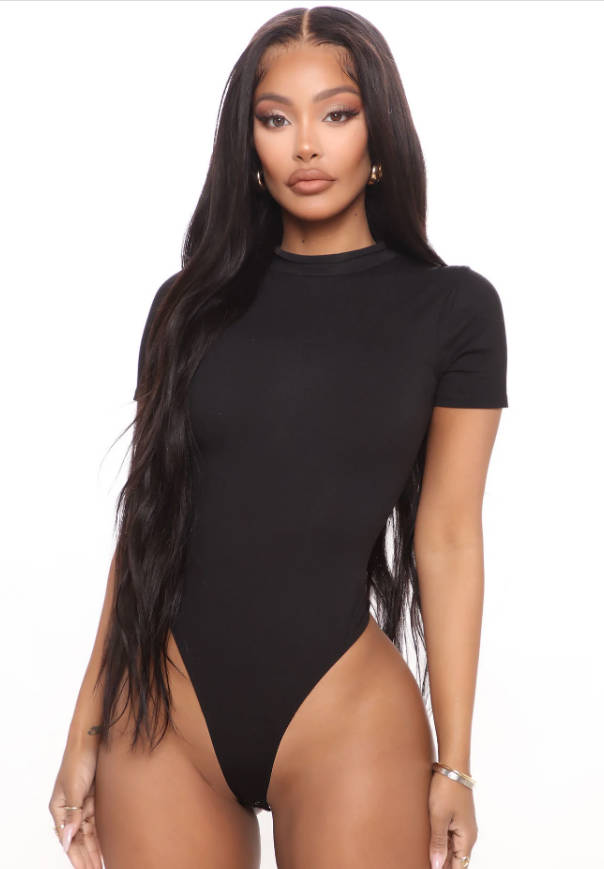 \
期望结果 \
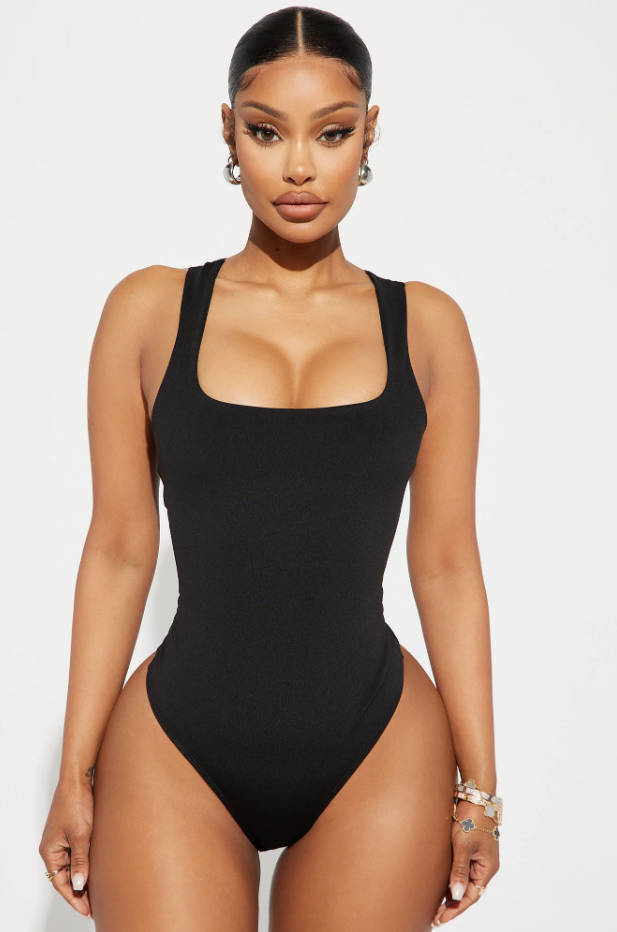 \
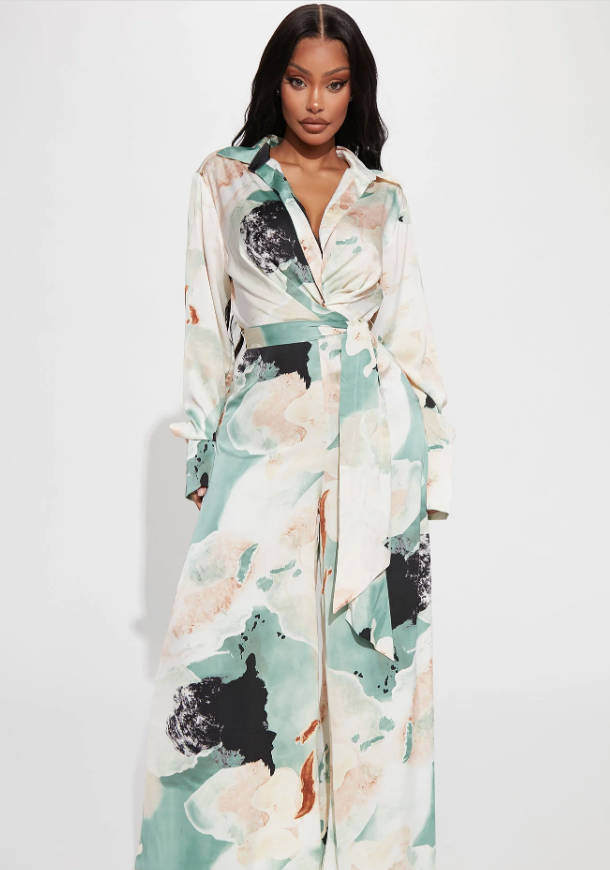 \
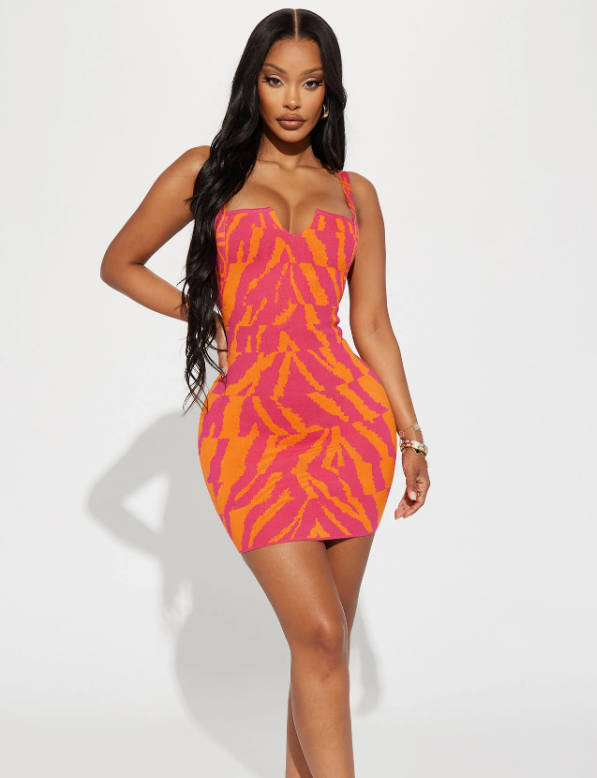 \
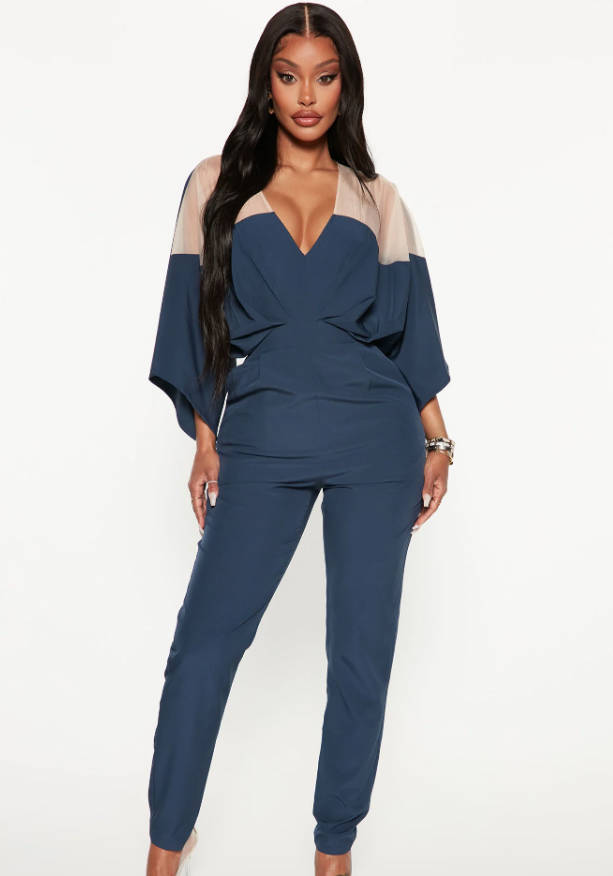

In [36]:
response = opensearch_search_query('/Users/fangyili/Downloads/搜图10.19/模特相同，款式不同/1/1、搜索原图.jpg', "Same person different product")

{'code': 200, 'message': 'Search completed successfully', 'data': {'results': [{'id': '1%3A0%3An3qYAJMBoapzJB17W3Jl', 'score': 1.3502928, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Woman\n- Long dark hair\n- Black bodysuit\n- Jewelry\n\n## Summary\nThe image depicts a young woman with long, dark hair wearing a fitted black bodysuit. She has makeup on and is accessorized with earrings and bracelets. The background appears to be a portrait studio setting.\n</result>', 'image_path': 'images/a5e78387-12b1-4797-b44c-9dd13acecf32'}, {'id': '1%3A0%3AlXrG7JIBoapzJB17f3Kp', 'score': 1.2376926, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Young woman\n- Long dark hair\n- Black bodysuit\n- Full body pose\n- Glamorous look\n\n## Summary\nThe image depicts a glamorous young woman with long, dark hair posing in a formfitting black bodysuit or leotard, capturing her full body and modeling her appearance.\n\n</result>', 'image_path': 'images/50230b3f-08aa-4d56-b483-ce5c1ee08b

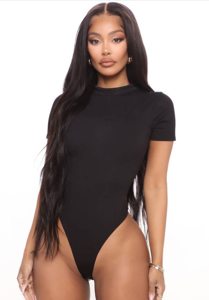

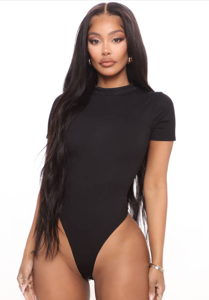

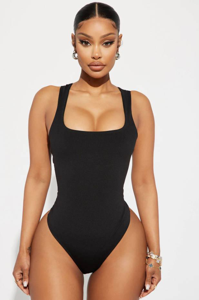

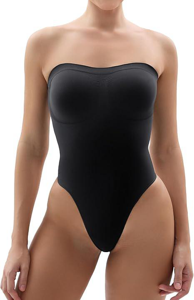

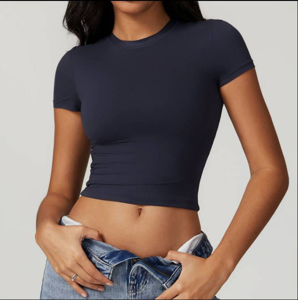

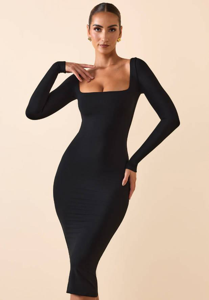

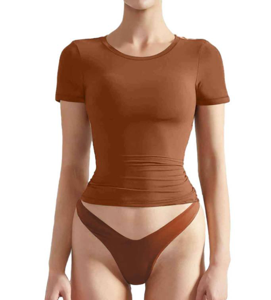

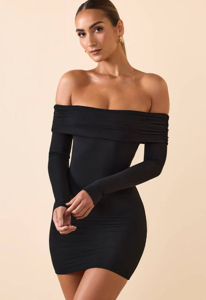

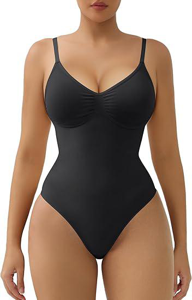

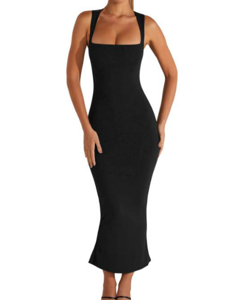

In [37]:
display_search_result(response)

### Sample 2
搜索文字：Same person different product \
搜索原图：\
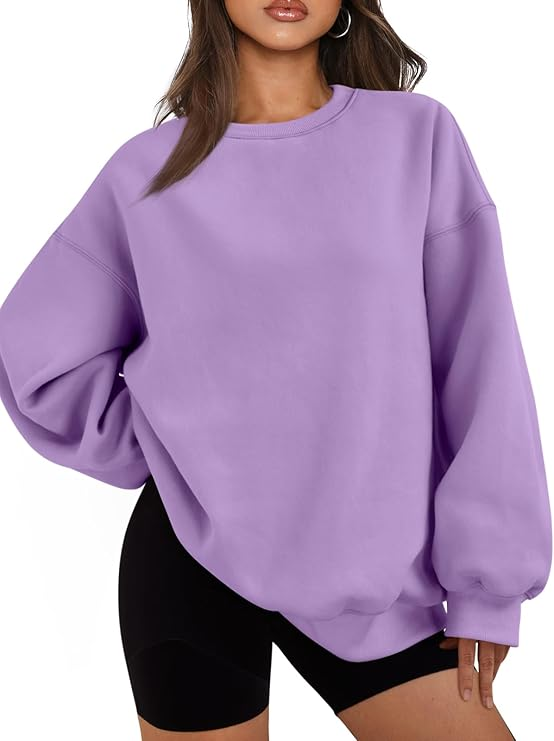 \
期望结果 \
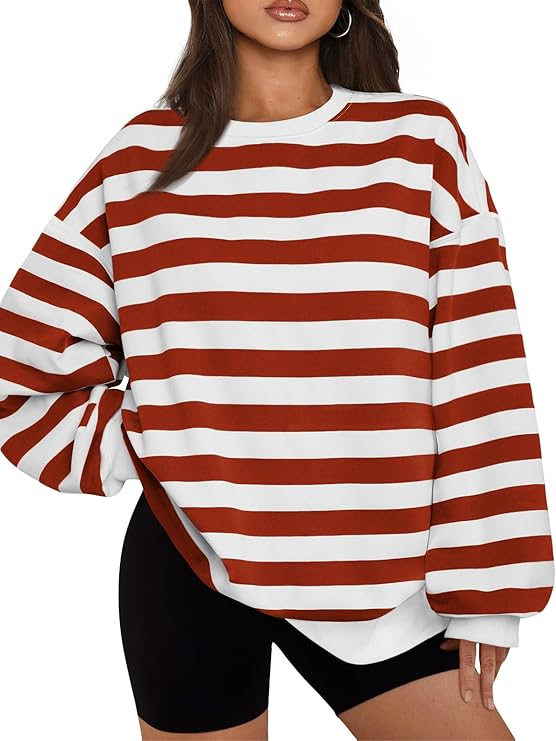 \
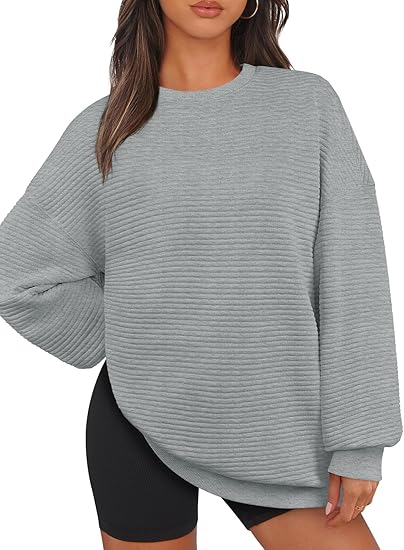

In [34]:
response = opensearch_search_query('/Users/fangyili/Downloads/搜图10.19/模特相同，款式不同/2/2、搜索原图.jpg', "Same model different product")

{'code': 200, 'message': 'Search completed successfully', 'data': {'results': [{'id': '1%3A0%3A-DmZAJMBuhEDGyExULOl', 'score': 1.3406608, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Purple sweatshirt\n- Long sleeves\n- Oversized fit\n- Fashion\n- Clothing\n\n## Summary\nThe image shows a close-up view of a woman wearing an oversized, purple sweatshirt with long sleeves. The focus is on the clothing item showcasing its relaxed, baggy fit and vibrant lavender color.\n\n</result>', 'image_path': 'images/0ec290a4-b478-4e91-8ccc-493c989397a6'}, {'id': '1%3A0%3A6Tm-7JIBuhEDGyExTLPM', 'score': 1.2748531, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Purple sweater\n- Long sleeves\n- Oversized fit\n- Fashion\n- Casual clothing\n\n## Summary\nThe image shows a close-up view of a woman wearing an oversized, purple sweater with long sleeves. The sweater appears to be a casual, loose-fitting style common in modern fashion trends.\n\n</result>', 'image_path': 'images/9a455fb

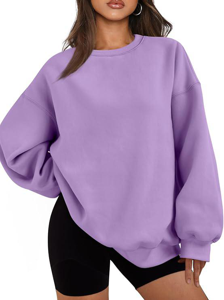

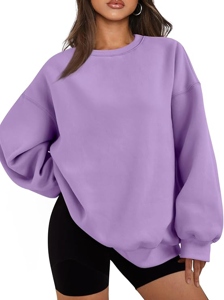

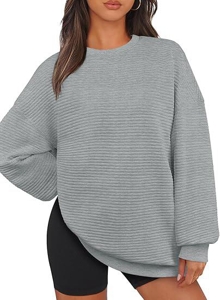

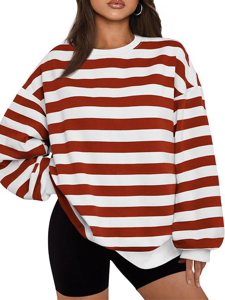

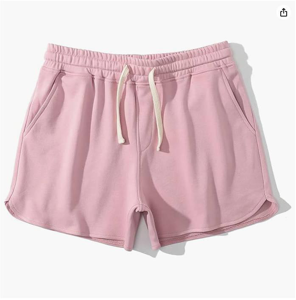

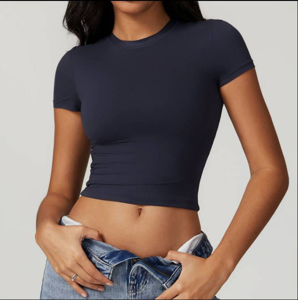

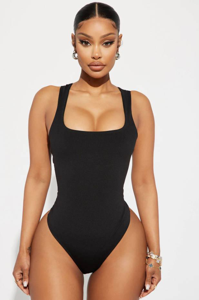

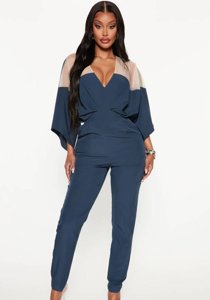

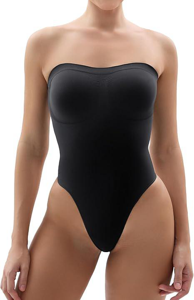

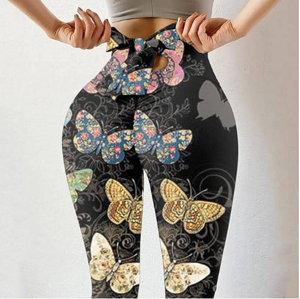

In [35]:
display_search_result(response)

### Sample 3
搜索文字：Same person different product \
搜索原图：\
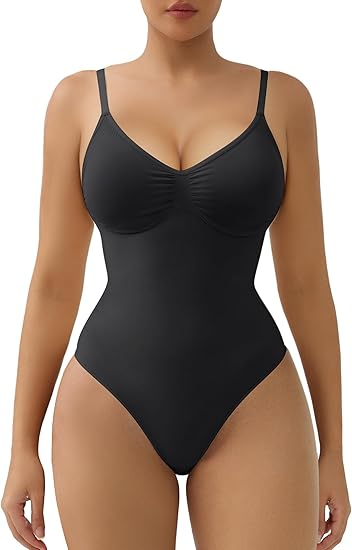 \
期望结果 \
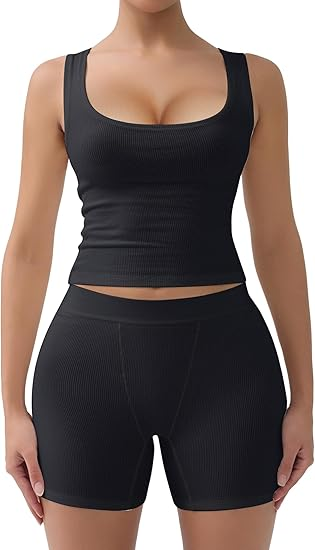 \
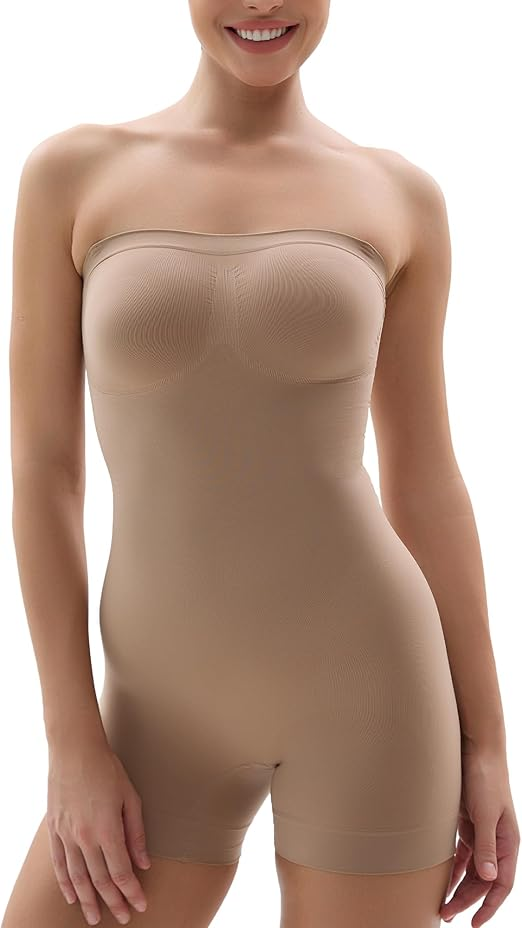 \
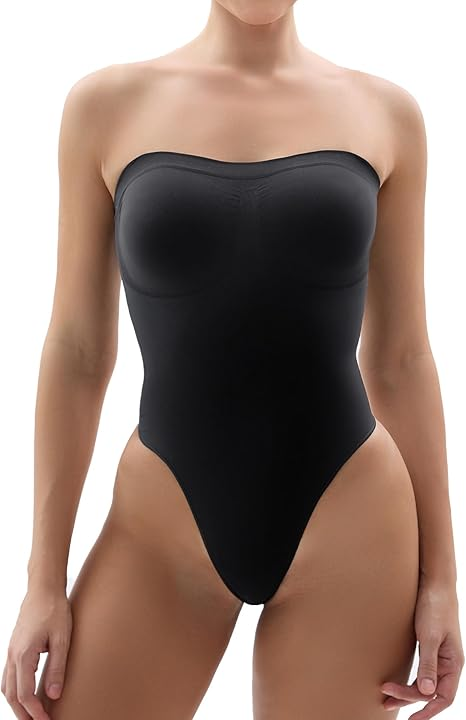 \
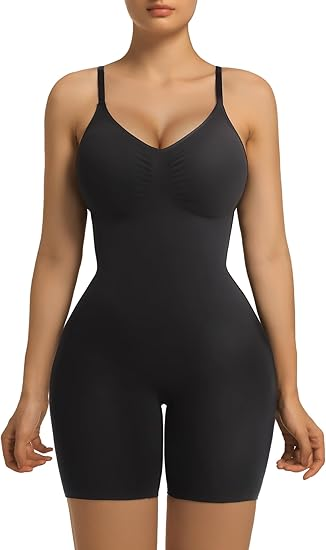 \
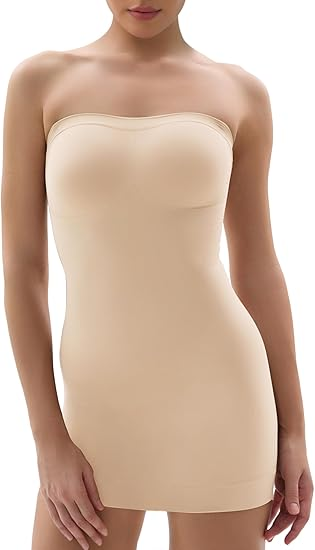

In [38]:
response = opensearch_search_query('/Users/fangyili/Downloads/搜图10.19/模特相同，款式不同/3/3、搜索原图.jpg', "Same model different product")

{'code': 200, 'message': 'Search completed successfully', 'data': {'results': [{'id': '1%3A0%3Ao3qZAJMBoapzJB17B3LH', 'score': 1.3382816, 'description': "<result>\n# Image Analysis\n\n## Tags\n- Woman\n- Swimsuit\n- Black\n- Body curve\n- Cleavage\n\n## Summary\nThis image depicts a woman's upper body wearing a low-cut, form-fitting black swimsuit that accentuates her curves and cleavage. The focus is on the feminine figure and outfit style.\n\n</result>", 'image_path': 'images/2cd10d0e-8138-4aa2-b930-ce305aabc96b'}, {'id': '1%3A0%3A9jmYAJMBuhEDGyEx9bOd', 'score': 1.1446748, 'description': "<result>\n# Image Analysis\n\n## Tags\n- Woman\n- Lingerie\n- Strapless\n- Black\n- Form-fitting\n\n## Summary\nThe image shows a partial view of a woman's upper body wearing a strapless, form-fitting black lingerie garment.\n\n</result>", 'image_path': 'images/d1f2f356-570c-4ad7-b589-c4a00f2e6e41'}, {'id': '1%3A0%3AoXqYAJMBoapzJB17u3LM', 'score': 1.1052039, 'description': "<result>\n# Image Analysi

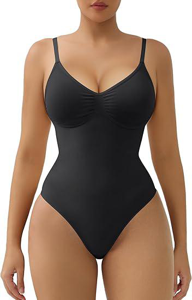

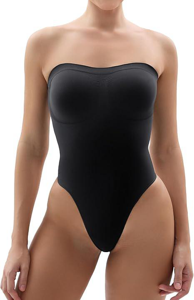

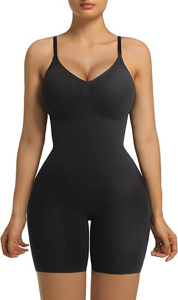

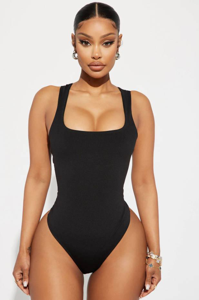

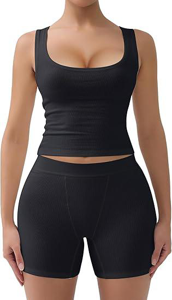

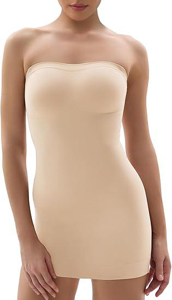

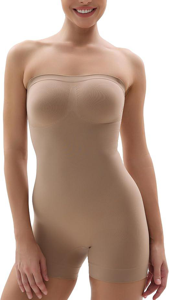

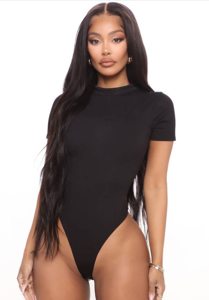

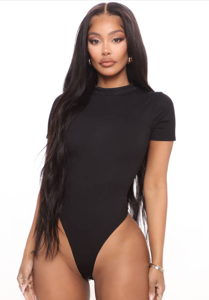

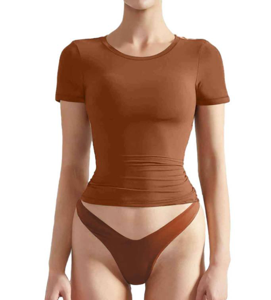

In [39]:
display_search_result(response)

## 3.6 款式相同，模特不同
搜索文字：Same product different model \
搜索原图：\
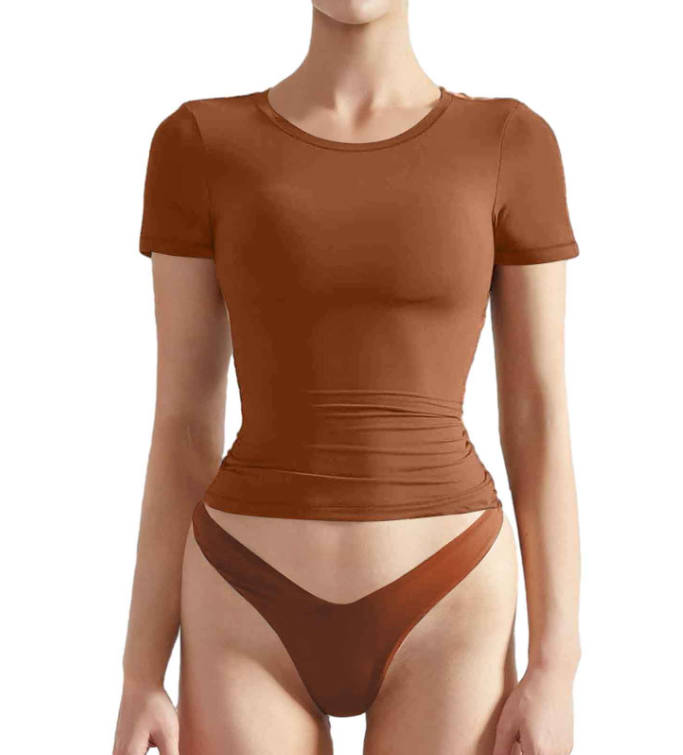 \
期望结果 \
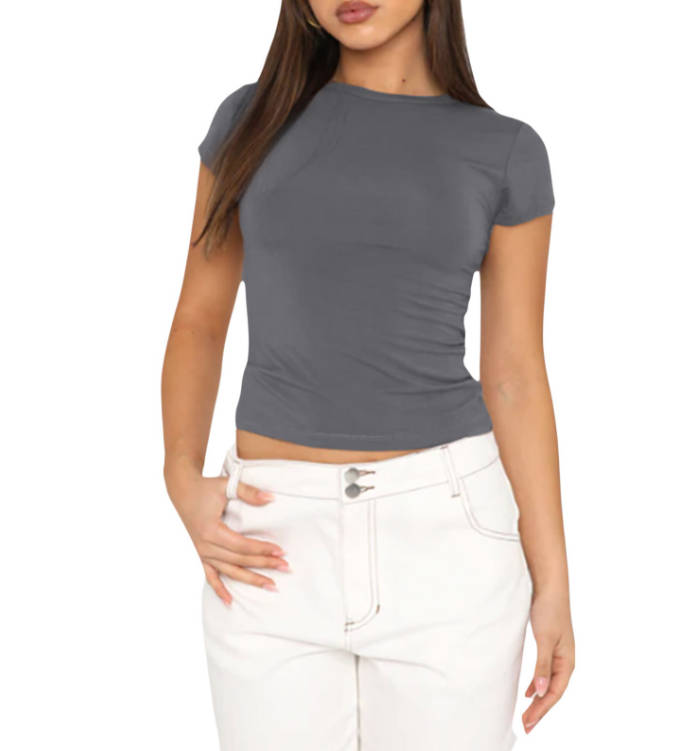 \
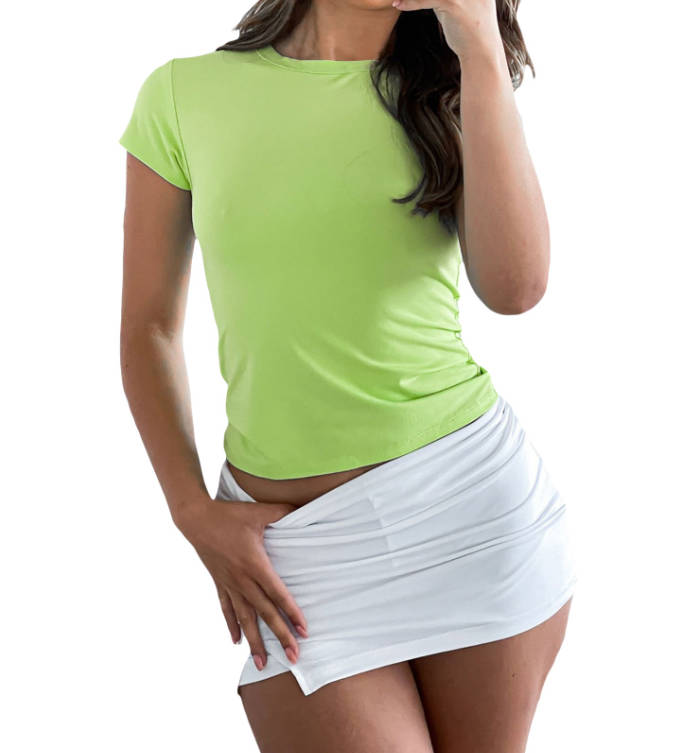 \
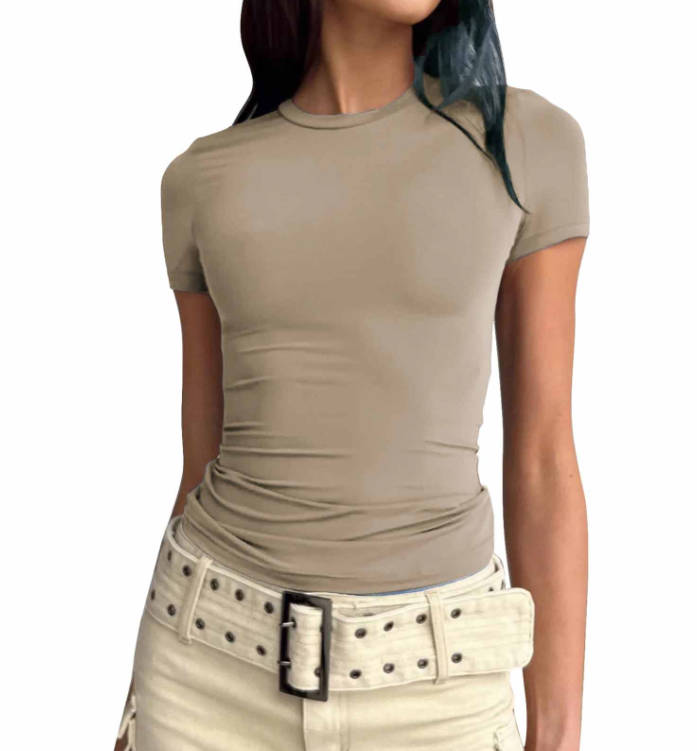 \
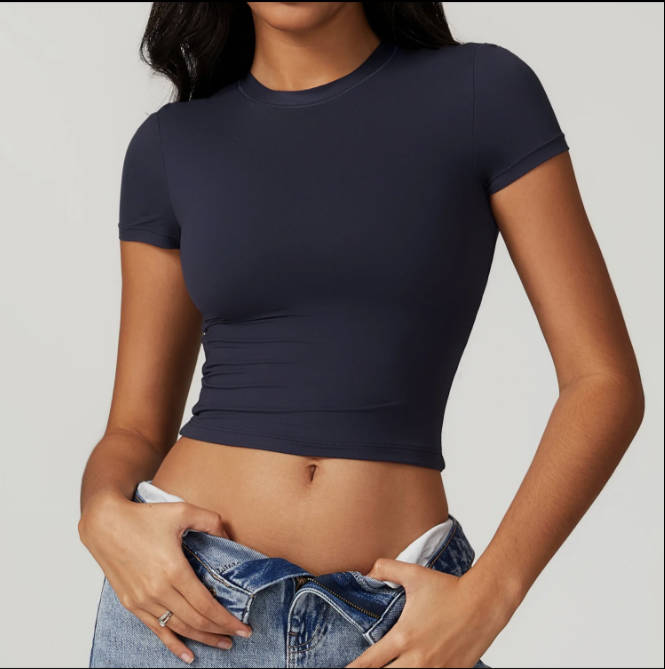

In [40]:
response = opensearch_search_query('/Users/fangyili/Downloads/搜图10.19/款式相同，模特不同/1、搜索原图.jpg', "Same product different model")

{'code': 200, 'message': 'Search completed successfully', 'data': {'results': [{'id': '1%3A0%3AqXqaAJMBoapzJB17LHJx', 'score': 1.3416694, 'description': "<result>\n# Image Analysis\n\n## Tags\n- Clothing\n- Undergarments\n- Brown\n- Crop top\n- Underwear\n\n## Summary\nThe image depicts a woman's torso wearing a form-fitting long-sleeved brown crop top and brown underwear bottoms against a plain background.\n</result>", 'image_path': 'images/fb01b004-80b9-453a-84b7-fb2fc9813b4c'}, {'id': '1%3A0%3AqnqaAJMBoapzJB17V3KN', 'score': 0.9724295, 'description': '<result>\n# Image Analysis\n\n## Tags\n- Woman\n- Beige shirt\n- Light jeans\n- Belt with studs\n\n## Summary\nThe image shows a woman wearing a form-fitting beige shirt and light-colored jeans with a studded belt at the waist. She has long, dark hair.\n\n</result>', 'image_path': 'images/4b9eb6f7-0883-4870-9c41-55f0c34feb14'}, {'id': '1%3A0%3A_TmaAJMBuhEDGyExPbNJ', 'score': 0.9540963, 'description': '<result>\n# Image Analysis\n\n## T

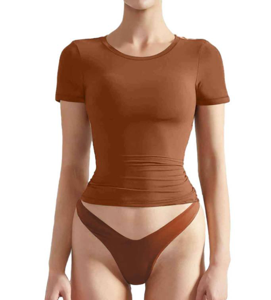

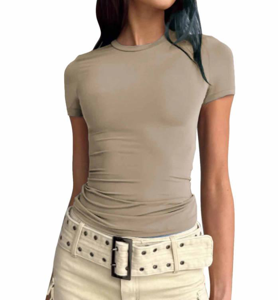

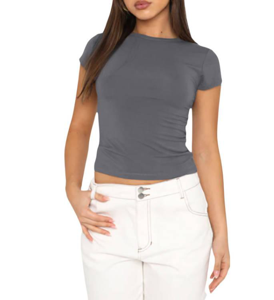

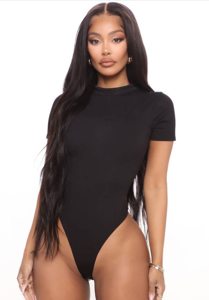

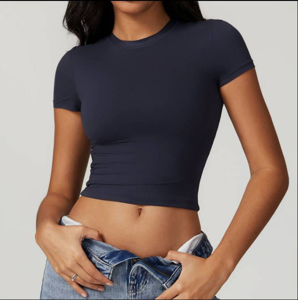

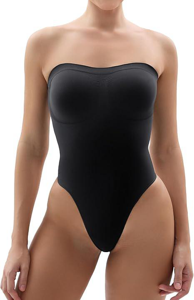

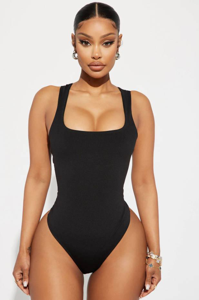

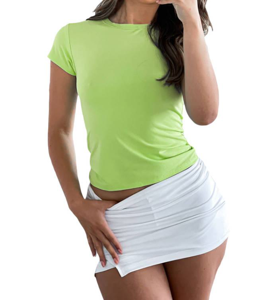

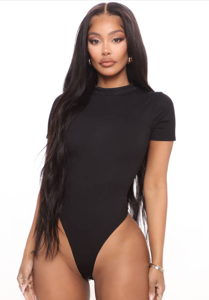

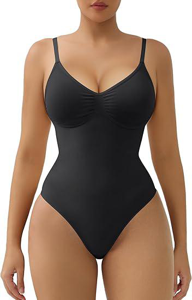

In [41]:
display_search_result(response)